In [1]:
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn import datasets
import json
import numpy as np
import cv2
import boto3
from utils import *
from PIL import Image
from matplotlib import pyplot as plt
import matplotlib.patches as patches
from roboflow import Roboflow
from segment_anything import SamPredictor, sam_model_registry
from helper_code.full_extraction_pipeline import get_reconstructed_plot, is_valid_color

import pandas as pd
import seaborn as sns
from collections import Counter
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
import colorsys
import os

In [2]:
rf = Roboflow(ROBOFLOW_API_KEY)
project = rf.workspace().project("legend_classified")
model = project.version(5).model

loading Roboflow workspace...
loading Roboflow project...


In [3]:
sam = sam_model_registry["default"](checkpoint="../../../Downloads/sam_vit_h_4b8939.pth")
predictor = SamPredictor(sam)

In [4]:
second_axis = {
    1: False,
    2: False,
    3: False,
    4: False,
    5: False,
    6: False,
    7: False,
    8: False,
    9: False,
    10: False,
    11: False,
    12: False,
    13: True,
    14: False,
    15: True,
    16: True,
    17: False,
    18: False,
    19: True,
    20: True,
    21: True,
    22: False,
    23: False,
    24: False,
    25: True,
    26: True,
    27: True,
    28: True
}

In [5]:
from helper_code.axes_extraction import get_second_y_range
from helper_code.full_extraction_pipeline import do_complete_analysis, get_fast_bounding_box
from helper_code.legend_extraction import extracted_mask

def get_reconstructed_plot(image_num, sam_predictor, yolo_model, image_alter, margin):
    prompt = {}
    with open('../plot_json/'+str(image_num)+'.json', 'r') as file:
        prompt = json.load(file)
    
    image_name, boundingBox = get_fast_bounding_box(image_num, sam_predictor)
    if second_axis[image_num]:
        print("SECOND RANGE")
        second_y_range = get_second_y_range(image_name, boundingBox)
    print(boundingBox)

    image = cv2.imread(image_name)
    cv2.rectangle(image, boundingBox['topLeft'], boundingBox['bottomRight'], (0, 0, 255), 2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f'Bounding Box in Image {image_num}')
    plt.show()
    
    extra_info = extracted_mask(image_name, yolo_model)
    coordinates, x_axis_title, y_axis_title, axis_labels, rgb_colors, x_range, y_range, memo = do_complete_analysis(1, 1, prompt, image_name, boundingBox, extra_info, image_alter, margin)

    return coordinates, x_axis_title, y_axis_title, axis_labels, rgb_colors, x_range, y_range, memo, second_y_range

In [6]:
# Function to adjust the lightness of a color
def adjust_lightness(color, factor):
    # Convert named color to RGB
    r, g, b = to_rgb(color)
    # Convert RGB to HLS
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    # Adjust lightness
    l = max(min(l * factor, 1), 0)
    # Convert back to RGB
    r, g, b = colorsys.hls_to_rgb(h, l, s)
    return r, g, b

In [7]:
def plot_clusters(data, clusters, entire_color, ax, series_label):
    print(clusters)
    # Convert the named color to an RGB tuple
    base_color = entire_color
    
    # Unique cluster labels
    unique_labels = set(clusters)
    
    new_colors = [adjust_lightness(entire_color, 1 - 0.2 * i) for i in range(len(unique_labels))]

    # Plot each cluster
    for k, col in zip(unique_labels, new_colors):
        # Filter data points that belong to the current cluster
        class_member_mask = (clusters == k)

        print(col)
        
        # Plot data points that are in the cluster
        ax.scatter(data.loc[class_member_mask, 'X'], data.loc[class_member_mask, 'Y'], color=col, s=1, label=series_label+" Cluster #" +str(k))
        ax.legend()

        # # Plot the outliers
        # if k == -1:
        #     xy = data[class_member_mask]
        #     ax.plot(xy[:, 0], xy[:, 1], markerfacecolor=col, markersize=1)

In [8]:
def convert_y_value(original_y, first_y_axis, second_y_axis):
    x0, y0 = first_y_axis
    x, y = second_y_axis
    # Apply the linear transformation formula
    new_y = x + (y - x) * (original_y - x0) / (y0 - x0)
    return new_y

In [11]:
def plot_second_clusters(data, clusters, entire_color, ax, ax2, series_label, clusters_dict, first_y_axis, second_y_axis):
    print(clusters)
    base_color = entire_color
    unique_labels = set(clusters)
    new_colors = [adjust_lightness(base_color, 1 - 0.2 * i) for i in range(len(unique_labels))]

    for k, col in zip(unique_labels, new_colors):
        class_member_mask = (clusters == k)
        new_label = series_label + " Cluster #" + str(k)
        marker = '*'
        
        # Check if the cluster is plotted on the right and needs y-value conversion
        if new_label in clusters_dict:
            axis_side = clusters_dict[new_label]
            
            if axis_side == "right":
                marker = 'v'
                data.loc[class_member_mask, 'Y'] = data.loc[class_member_mask, 'Y'].apply(convert_y_value, args=(first_y_axis, second_y_axis))
                ax2.scatter(data.loc[class_member_mask, 'X'], data.loc[class_member_mask, 'Y'], color=col, s=20, marker=marker, label=series_label)
            
            elif axis_side == "left":
                    marker = 'o'
                    ax.scatter(data.loc[class_member_mask, 'X'], data.loc[class_member_mask, 'Y'], color=col, s=20, marker=marker, label=series_label)
            
            else:
                ax.scatter(data.loc[class_member_mask, 'X'], data.loc[class_member_mask, 'Y'], color=col, s=20, marker=marker, label=series_label)
        else:
            ax.scatter(data.loc[class_member_mask, 'X'], data.loc[class_member_mask, 'Y'], color=col, s=20, marker=marker, label=series_label)


        print("Color", col)
        print("Label", new_label)
        print("Marker", marker)

    handles, labels = [], []
    for a in [ax, ax2]:
        h, l = a.get_legend_handles_labels()
        handles.extend(h)
        labels.extend(l)
    ax.legend(handles, labels, loc='best')

In [12]:
def create_df(rgb_colors, coordinates):
    temp = []
    for index, value in enumerate(coordinates):
        
        for i in range(len(value)):
            temp.append([rgb_colors[index], value[i]["middle"][0], value[i]["middle"][1]])
    
    df = pd.DataFrame(temp, columns=["Color", "X", "Y"])
    return df

In [13]:
def get_optimal_eps_elbow(std_df):
    """
    Based on methods: https://www.kaggle.com/code/tanmaymane18/nearestneighbors-to-find-optimal-eps-in-dbscan

    Args:
        std_df (_type_): _description_

    Returns:
        _type_: _description_
    """    
    # Fit Nearest Neighbors
    nn = NearestNeighbors(n_neighbors=200).fit(std_df)
    distances, indices = nn.kneighbors(std_df)

    # Sort distances
    distances = np.sort(distances, axis=0)
    distances = distances[:, 199]  # The distance to the 20th nearest neighbor

    # Normalize the distances to [0, 1] for both x and y
    norm_distances = distances / distances.max()
    x = np.linspace(0, 1, len(distances))

    # Coordinates of the line
    line_start = np.array([x[0], norm_distances[0]])
    line_end = np.array([x[-1], norm_distances[-1]])

    # Function to calculate distance from a point to a line (start and end)
    def point_line_distance(point, start, end):
        return np.abs(np.cross(end-start, start-point)) / np.linalg.norm(end-start)

    # Calculate distances from each point to the line
    distances_to_line = np.apply_along_axis(point_line_distance, 1, np.vstack((x, norm_distances)).T, line_start, line_end)

    # Find the index of the point with the maximum distance to the line
    elbow_index = np.argmax(distances_to_line)

    eps_best = distances[elbow_index]
    

    # Plot the curve and the elbow point
    plt.figure(figsize=(10,6))
    plt.plot(x, norm_distances, label='K-nearest neighbor distance')
    plt.scatter(x[elbow_index], norm_distances[elbow_index], color='red', s=100, label='Elbow Point', zorder=5)
    plt.title('Elbow Method for Optimal Eps Value')
    plt.xlabel('Points sorted by distance')
    plt.ylabel('Normalized distance to 20th nearest neighbor')
    plt.legend()
    plt.show()

    return eps_best

One of the images is the figure from the paper. The other one is a reconstruction of the image. Can you please tell me which clusters in the reconstruction correspond with which axis ("left" or "right") based on the information in the figure from the paper.

Format your answer with in the following JSON format:

{
    "clusters": [
        { 
            "title": [CLUSTER NAME AND NUMBER],
            "axis": "left" or "right",
            "axis_title": [NAME OF THE RELEVANT AXIS]
        },
        { 
            "title": [CLUSTER NAME AND NUMBER],
            "axis": "left" or "right",
            "axis_title": [NAME OF THE RELEVANT AXIS]
        }
    ]
}

In [14]:
import json
def load_second_axis(image_num):

    file_path = '../second_axis_information/'+str(image_num) + '.json'

    with open(file_path, 'r') as file:
        data = json.load(file)

    # Initialize variables and dictionary
    left_axis_title = ""
    right_axis_title = ""
    clusters_dict = {}

    # Process each cluster in the JSON data
    for cluster in data['clusters']:
        title = cluster['title']
        axis = cluster['axis']
        axis_title = cluster["axis_title"]
        
        if axis == 'left':
            left_axis_title = axis_title
        elif axis == 'right':
            right_axis_title = axis_title
        
        clusters_dict[title] = axis
    
    return left_axis_title, right_axis_title, clusters_dict

In [15]:
def second_axis_clustering_elbow_method(image_num, rgb_colors, coordinates, series_labels, x_axis_title, y_axis_title, min_samples_best, first_y_range, second_y_range):
    df = create_df(rgb_colors, coordinates)

    clusters = {}
    for unique_color in rgb_colors:
        try:
            filtered_df = df[df['Color'] == unique_color]

            # Standardize the coordinates
            st = StandardScaler()
            std_df = pd.DataFrame(st.fit_transform(filtered_df[['X', 'Y']]), columns=['X', 'Y'])

            eps_best = get_optimal_eps_elbow(std_df)

            labels = DBSCAN(min_samples=min_samples_best, eps = eps_best).fit(std_df).labels_
            colored_clusters = len(Counter(labels))
            clusters[unique_color] = labels
            
            print(f"Number of clusters: {colored_clusters}")
            print(f"Number of outliers: {Counter(labels)[-1]}")
            print(f"Silhouette_score: {silhouette_score(std_df, labels)}")

            plt.figure(figsize=(10,8))
            sns.scatterplot(x=std_df['X'], y=std_df['Y'], hue=labels, palette='viridis')

        except:
            continue

    # Create a plot
    fig, ax = plt.subplots(figsize=(12, 8))

    ax2 = ax.twinx()
    ax2.set_ylim(second_y_range[0], second_y_range[1])  # Set limits for the second y-axis
    ax.set_ylabel(y_axis_title)
    ax2.set_ylabel('Y Axis 2')  # For the second y-axis

    
    # Plot each color series
    for color, label in zip(rgb_colors, series_labels):
        try:
            filtered_df = df[df['Color'] == color]
            points = filtered_df[['X', 'Y']]
            plot_clusters(points, clusters[color], color, ax, label)
        except:
            continue

    # Title and labels
    plt.title('DBSCAN Clustering of Multicolored Data Points')
    plt.xlabel(x_axis_title)

    # Show the plot
    plt.show()


    left_axis_title, right_axis_title, clusters_dict = load_second_axis(image_num)

    ## UPDATED PLOT
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.set_ylim(first_y_range[0], first_y_range[1])
    ax2 = ax.twinx()
    ax2.set_ylim(second_y_range[0], second_y_range[1])  # Set limits for the second y-axis
    ax.set_ylabel(left_axis_title)
    ax2.set_ylabel(right_axis_title)  # For the second y-axis

    # Plot each color series
    for color, label in zip(rgb_colors, series_labels):
        try:
            filtered_df = df[df['Color'] == color]
            points = filtered_df[['X', 'Y']]
            plot_second_clusters(points, clusters[color], color, ax, ax2, label, clusters_dict, first_y_range, second_y_range)
        except:
            continue
    # Title and labels
    plt.title('DBSCAN Clustering of Multicolored Data Points')
    plt.xlabel(x_axis_title)

    # Show the plot
    plt.show()


In [16]:
def run_pipeline(image_num, min_samples):
    coordinates, x_axis_title, y_axis_title, axis_labels, rgb_colors, x_range, y_range, memo, second_y_range = get_reconstructed_plot(image_num, predictor, model, True, 30)

    plt.figure()
    for index, value in enumerate(coordinates):
        x = []
        y = []

        for i in range(len(value)):
            x.append(value[i]["middle"][0])
            y.append(value[i]["middle"][1])

        color_normalized = rgb_colors[index]

        if (is_valid_color(color_normalized)): plt.scatter(x, y, label=axis_labels[index], color=color_normalized, s=1)

    plt.xlim(x_range[0], x_range[1])
    plt.ylim(y_range[0], y_range[1])
    plt.xlabel(x_axis_title)
    plt.ylabel(y_axis_title)
    plt.legend()
    plt.show()

    if second_axis[image_num]:
        try:
            second_axis_clustering_elbow_method(image_num, rgb_colors, coordinates, axis_labels, x_axis_title, y_axis_title, min_samples, y_range, second_y_range)
        except:
            print("ERROR CLUSTERING IMAGE", image_num)

**200 SAMPLES**

SECOND RANGE
SECOND Y MIN 0
SECOND Y MAX 1.2
SEMANTIC SECOND Y MIN 0.0
SEMANTIC SECOND Y MAX 1.2
SECOND Y
OCR DIFF -248.89096865057945
SEM DIFF 1.2
OCR RATIO -207.40914054214954
PIXEL DIFF 0.23463135212659836
REAL DIFF FROM BASE POINT -0.0011312488519709995
SECOND Y_MIN 0.0011312488519709995
SECOND Y_MAX 1.2064783196055628
{'topLeft': (76, 14), 'bottomRight': (574, 264)}


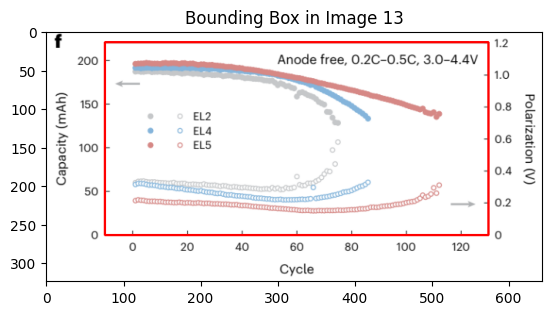

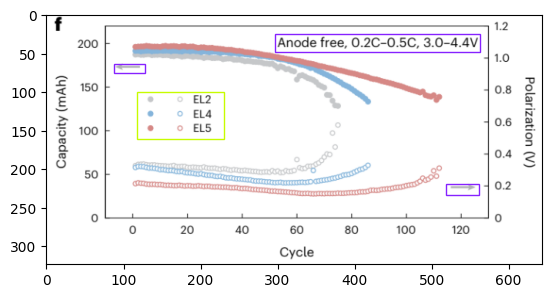

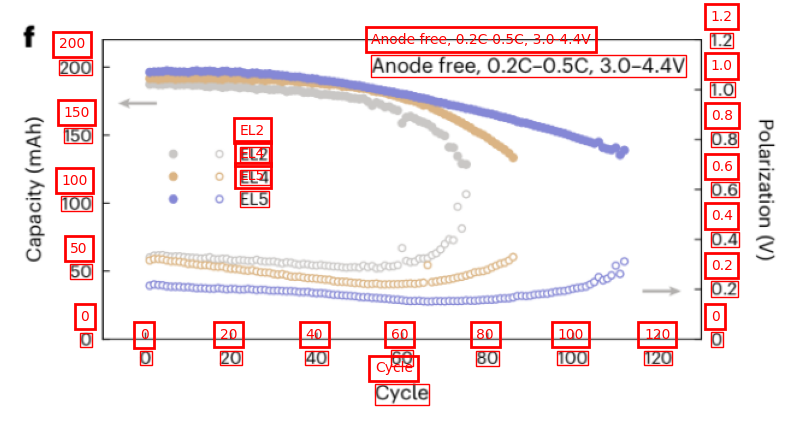

Y MIN 0
Y MAX 200
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 200.0
Y
OCR DIFF -226.1286244019866
SEM DIFF 200.0
OCR RATIO -1.1306431220099329
PIXEL DIFF 0.3697983920574188
REAL DIFF FROM BASE POINT -0.3270690679124567
Y_MIN 0.3270690679124567
Y_MAX 221.44016402538895
SEMANTIC X MIN 0.0
SEMANTIC X MAX 0.0
X
OCR DIFF 523.985451200977
SEM DIFF 0.0
OCR RATIO 0.0
PIXEL DIFF -13.008792079985142
REAL DIFF FROM BASE POINT -0.0
X_MIN 0.0
X_MAX 0.0
X
Predicted [0.0, 0.0]
Chat GPT [0, 120]
Y
Predicted [0.3270690679124567, 221.44016402538895]
Chat GPT [0, 200]


Attempting to set identical low and high xlims makes transformation singular; automatically expanding.


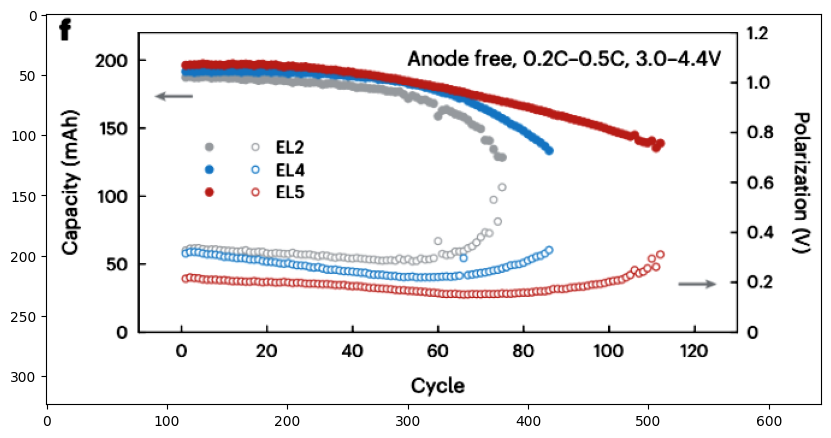

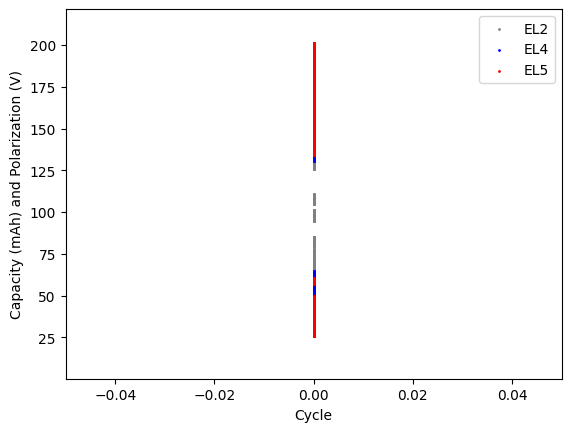

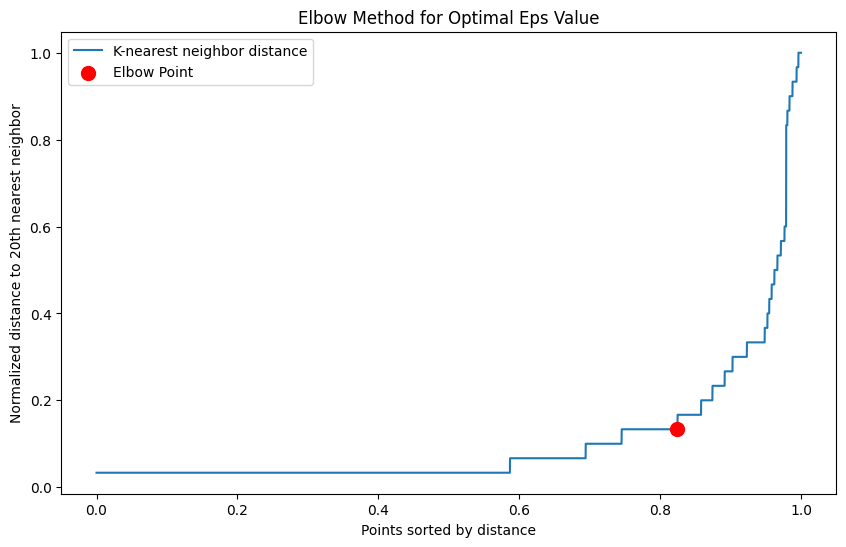

Number of clusters: 3
Number of outliers: 567
Silhouette_score: 0.7636341332409451


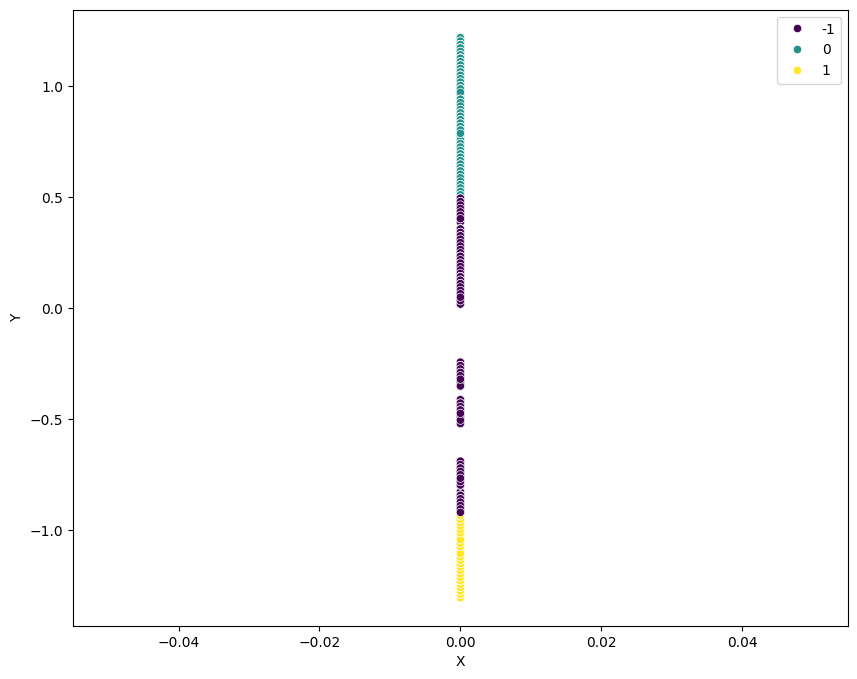

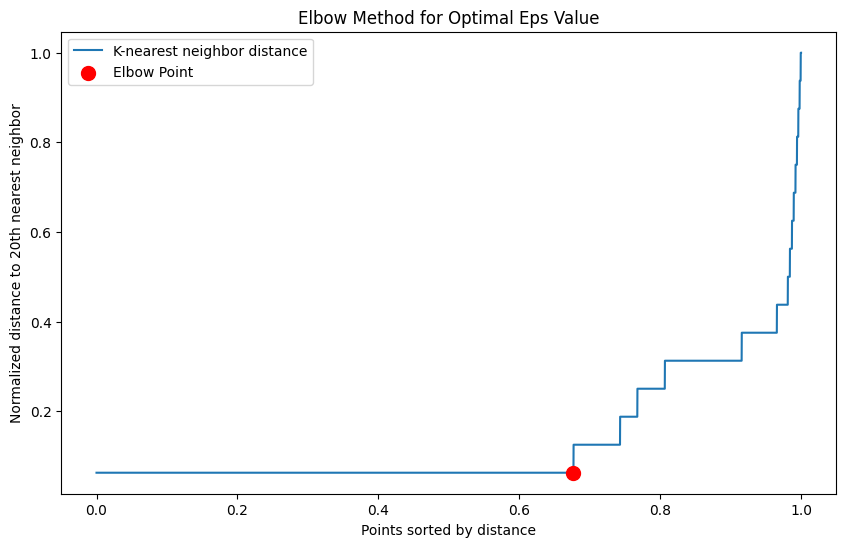

Number of clusters: 3
Number of outliers: 1310
Silhouette_score: 0.63883498894731


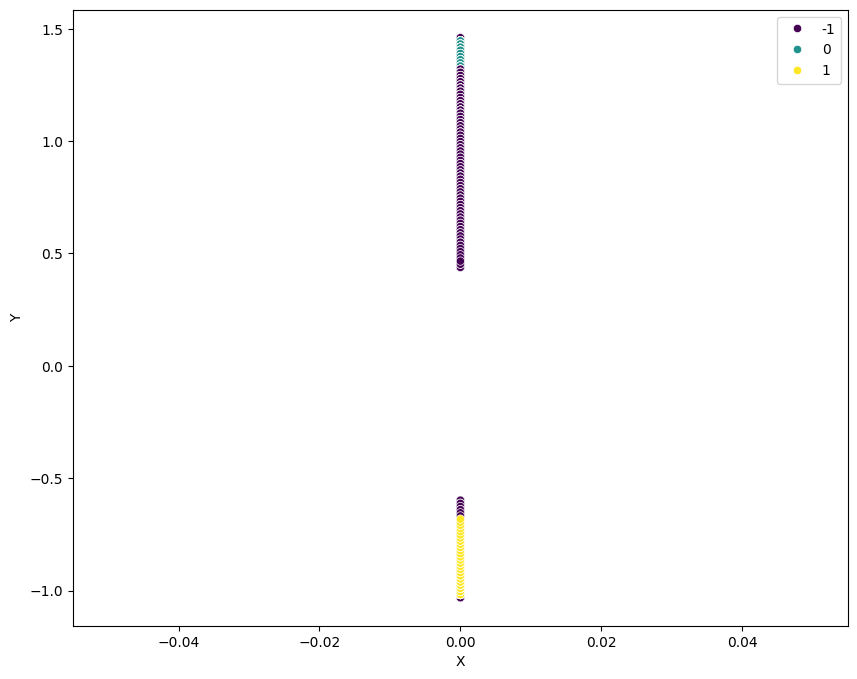

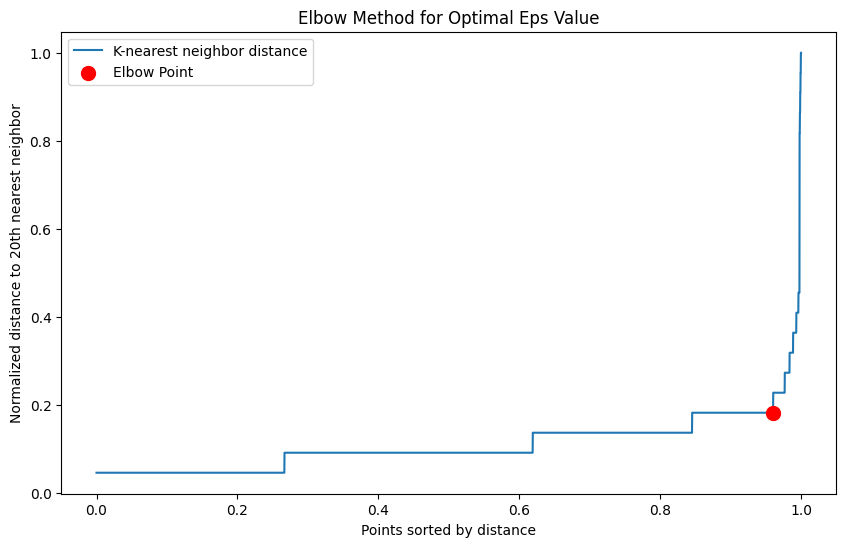

Number of clusters: 3
Number of outliers: 50
Silhouette_score: 0.764387715936822
[ 0  0  0 ... -1 -1 -1]
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
(0.30117647058823527, 0.30117647058823527, 0.30117647058823527)
[ 0  0  0 ... -1 -1  1]
(0.0, 0.0, 1.0)
(0.0, 0.0, 0.8)
(0.0, 0.0, 0.6)
[ 0  0  0 ... -1 -1 -1]
(1.0, 0.0, 0.0)
(0.8, 0.0, 0.0)
(0.6, 0.0, 0.0)


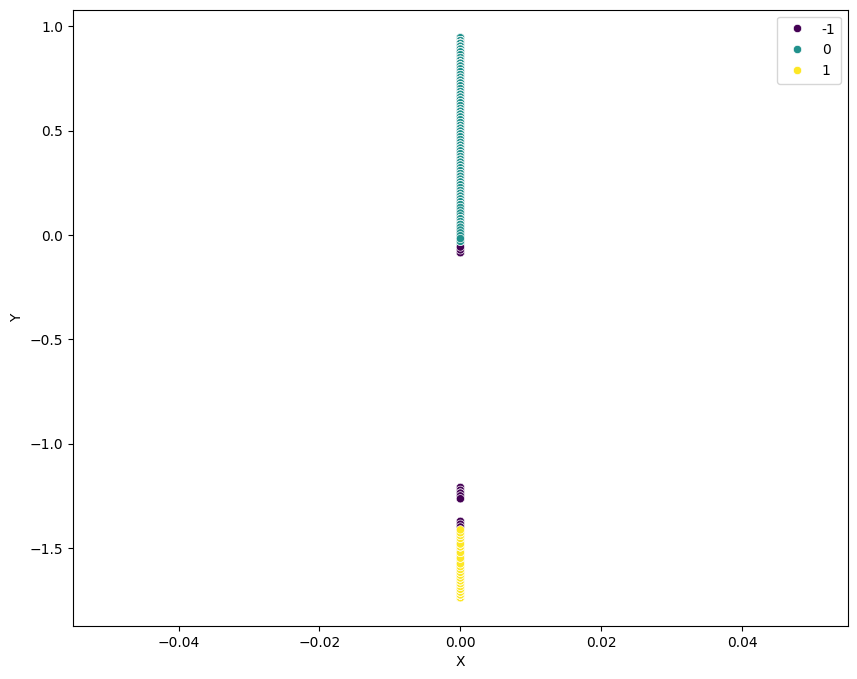

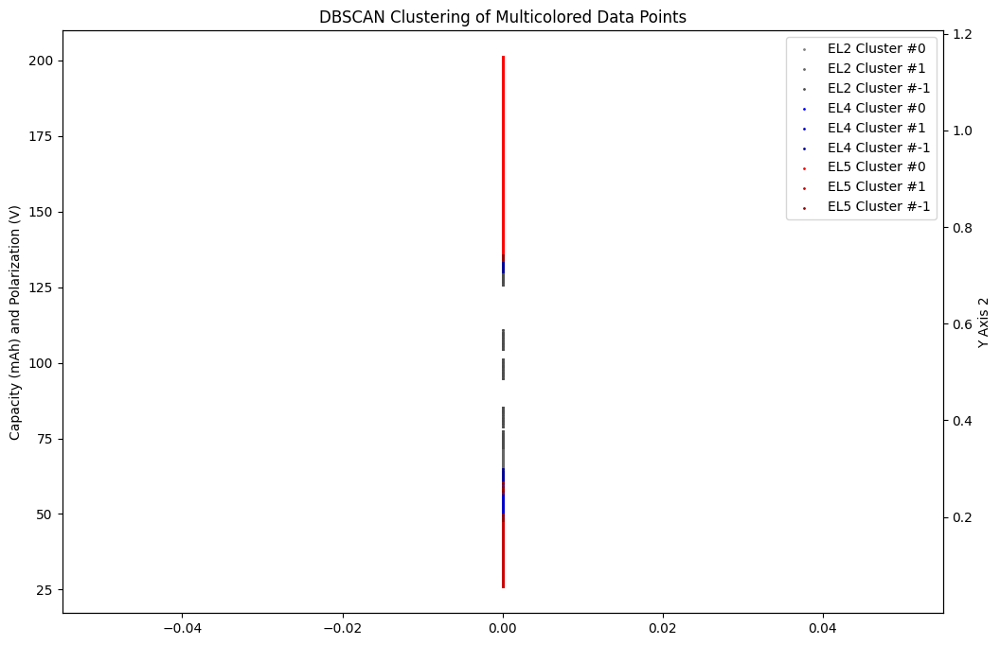

[ 0  0  0 ... -1 -1 -1]
Color (0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
Label EL2 Cluster #0
Marker o
Color (0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
Label EL2 Cluster #1
Marker v
Color (0.30117647058823527, 0.30117647058823527, 0.30117647058823527)
Label EL2 Cluster #-1
Marker *
[ 0  0  0 ... -1 -1  1]
Color (0.0, 0.0, 1.0)
Label EL4 Cluster #0
Marker o
Color (0.0, 0.0, 0.8)
Label EL4 Cluster #1
Marker v
Color (0.0, 0.0, 0.6)
Label EL4 Cluster #-1
Marker *
[ 0  0  0 ... -1 -1 -1]
Color (1.0, 0.0, 0.0)
Label EL5 Cluster #0
Marker o
Color (0.8, 0.0, 0.0)
Label EL5 Cluster #1
Marker v
Color (0.6, 0.0, 0.0)
Label EL5 Cluster #-1
Marker *



A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


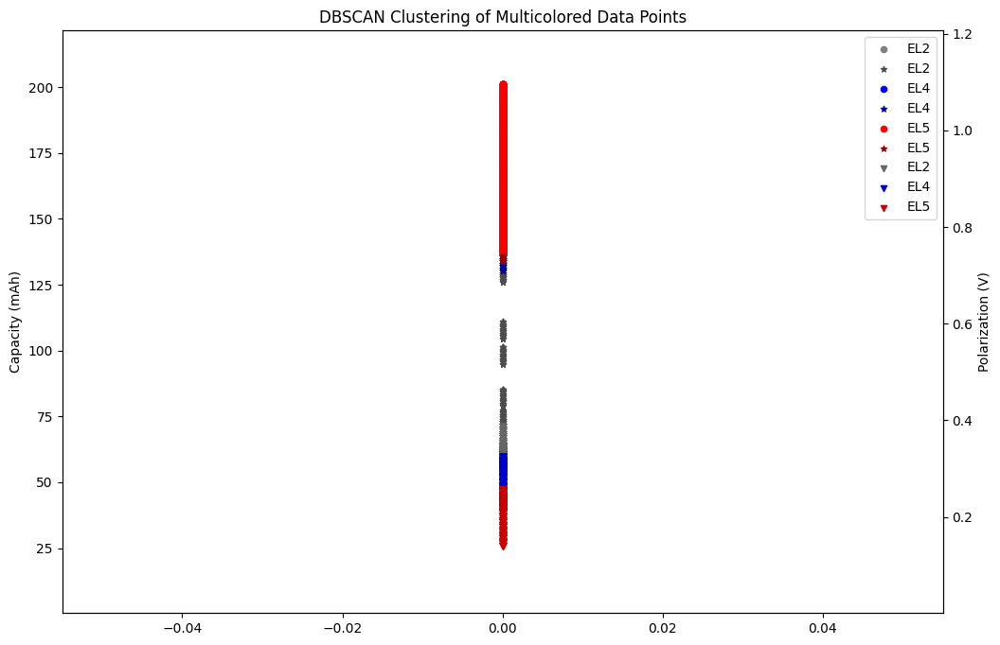

SECOND RANGE
SECOND Y MIN 0.5
SECOND Y MAX 2.5
SEMANTIC SECOND Y MIN 0.5
SEMANTIC SECOND Y MAX 2.5
SECOND Y
OCR DIFF -236.20909801870584
SEM DIFF 2.0
OCR RATIO -118.10454900935292
PIXEL DIFF -12.074313584715128
REAL DIFF FROM BASE POINT 0.10223411109896317
SECOND Y_MIN 0.3977658889010368
SECOND Y_MAX 2.506067407247136
{'topLeft': (69, 17), 'bottomRight': (567, 266)}


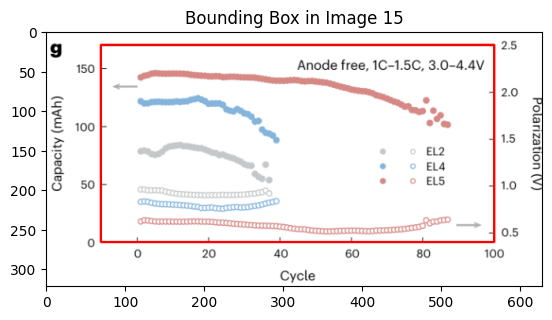

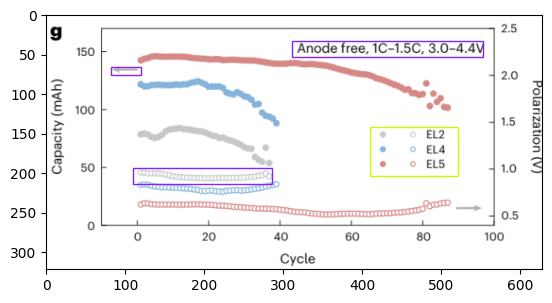

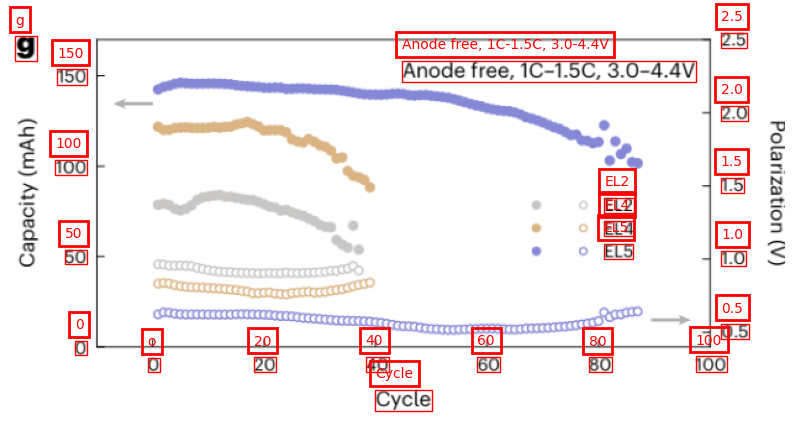

Y MIN 0
Y MAX 150
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 150.0
Y
OCR DIFF -219.88508423417807
SEM DIFF 150.0
OCR RATIO -1.465900561561187
PIXEL DIFF 1.3731517605483532
REAL DIFF FROM BASE POINT -0.9367291319446278
Y_MIN 0.9367291319446278
Y_MAX 170.7981825819757
SEMANTIC X MIN 0.0
SEMANTIC X MAX 100.0
X
OCR DIFF 510.9125428516418
SEM DIFF 100.0
OCR RATIO 0.19572821493450376
PIXEL DIFF -12.225043604150414
REAL DIFF FROM BASE POINT -2.392785962136833
X_MIN 2.392785962136833
X_MAX 99.8654369995197
X
Predicted [2.392785962136833, 99.8654369995197]
Chat GPT [0, 100]
Y
Predicted [0.9367291319446278, 170.7981825819757]
Chat GPT [0, 150]


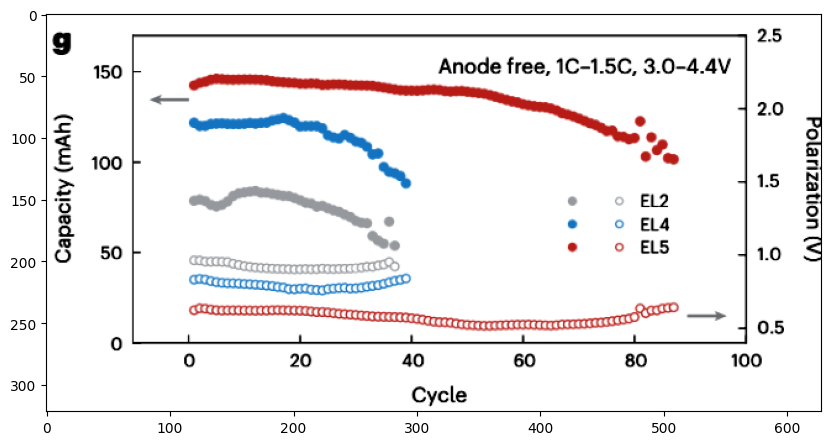

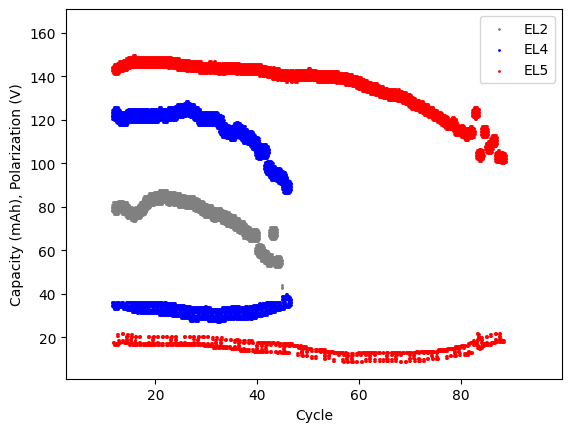

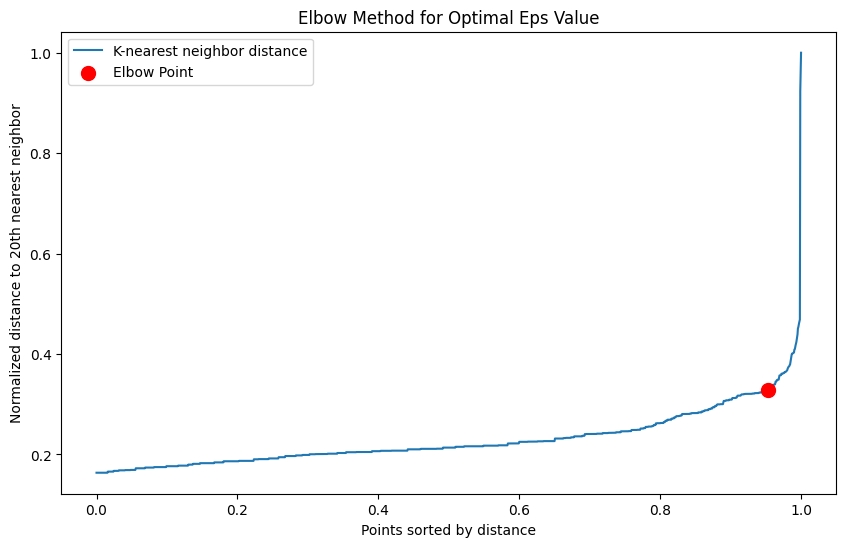

Number of clusters: 2
Number of outliers: 3
Silhouette_score: 0.4791251078131206


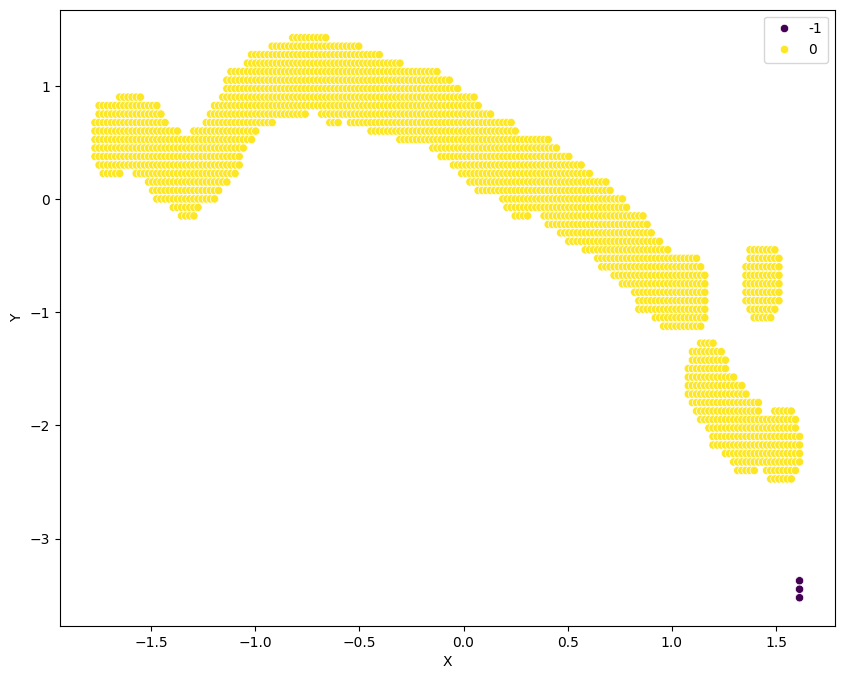

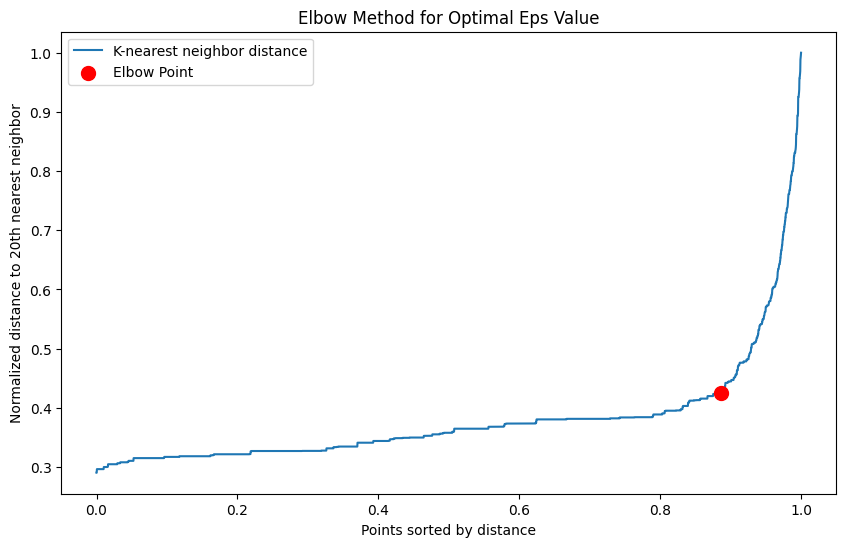

Number of clusters: 3
Number of outliers: 61
Silhouette_score: 0.36862674103678106


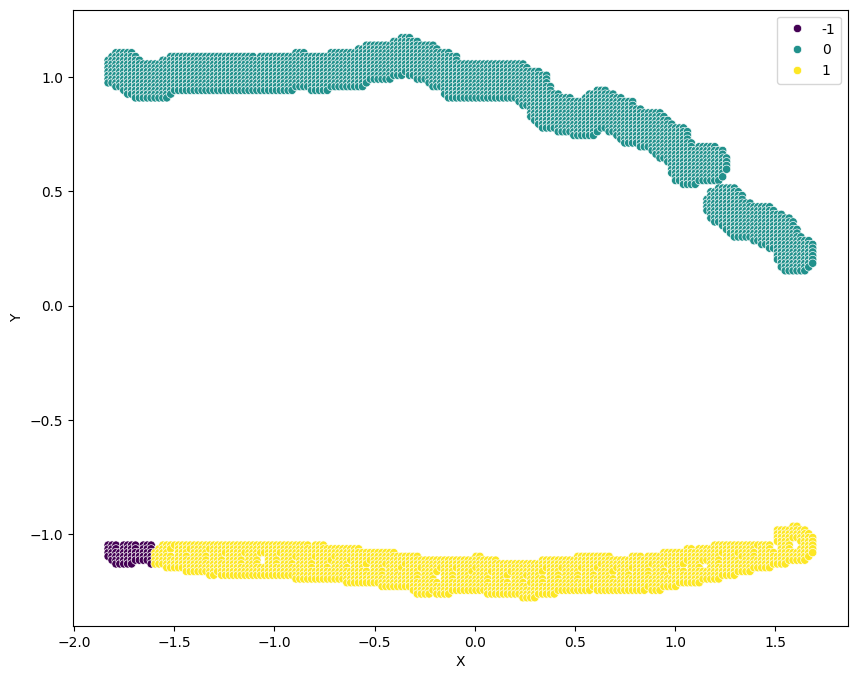

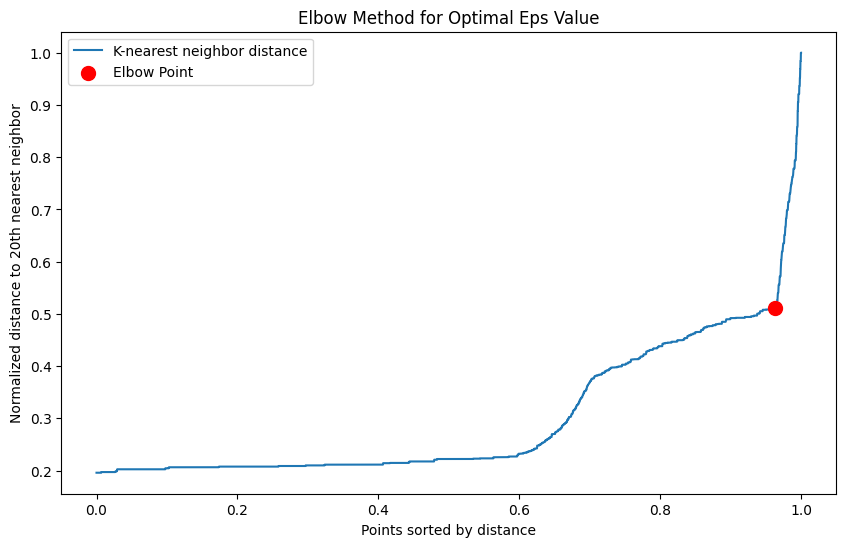

Number of clusters: 2
Number of outliers: 0
Silhouette_score: 0.5390815665421644
[ 0  0  0 ... -1 -1 -1]
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
[0 0 0 ... 1 1 1]
(0.0, 0.0, 1.0)
(0.0, 0.0, 0.8)
(0.0, 0.0, 0.6)
[0 0 0 ... 0 0 0]
(1.0, 0.0, 0.0)
(0.8, 0.0, 0.0)


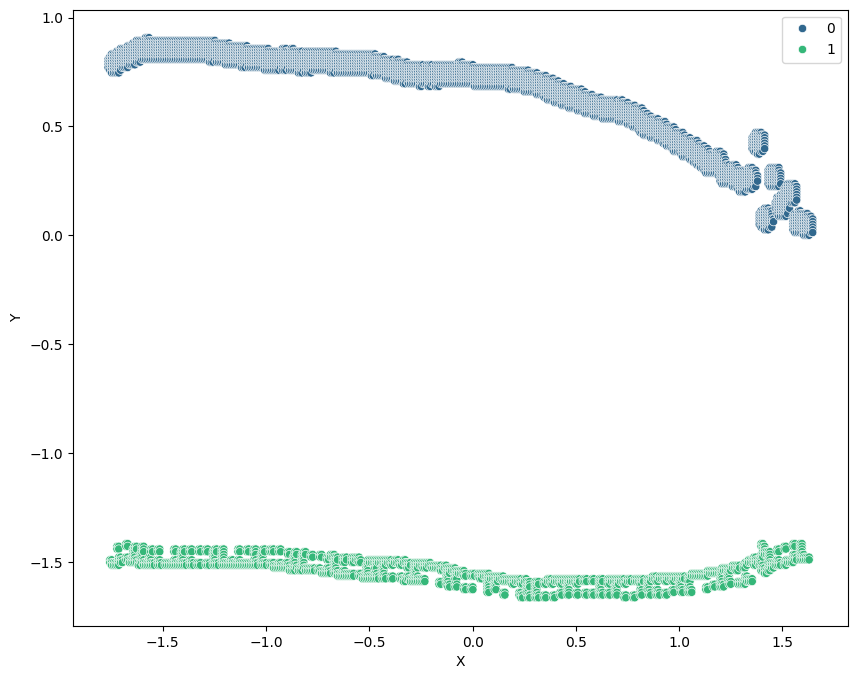

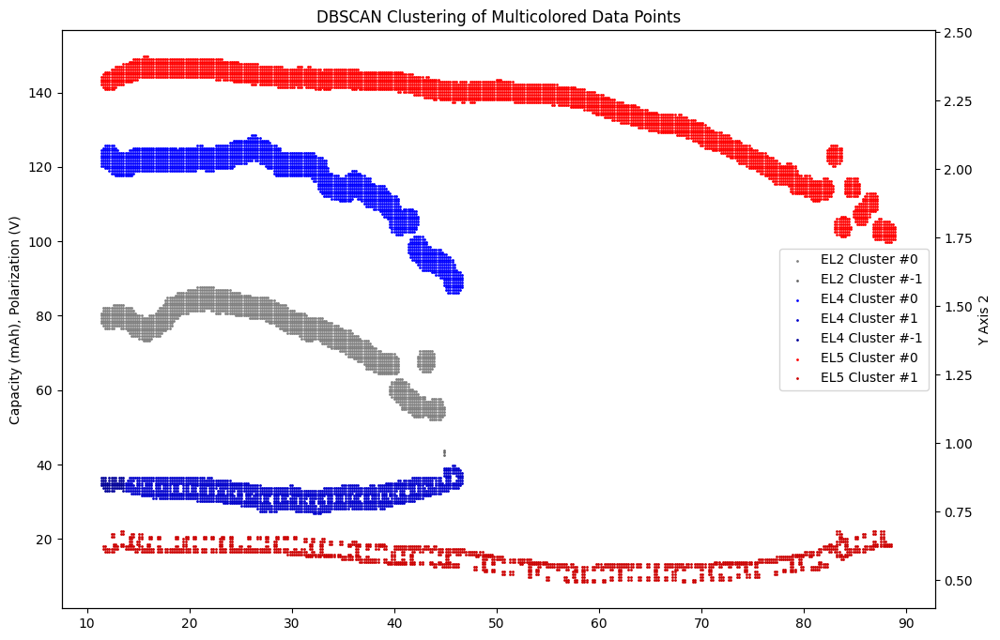

[ 0  0  0 ... -1 -1 -1]
Color (0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
Label EL2 Cluster #0
Marker o
Color (0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
Label EL2 Cluster #-1
Marker *
[0 0 0 ... 1 1 1]
Color (0.0, 0.0, 1.0)
Label EL4 Cluster #0
Marker o
Color (0.0, 0.0, 0.8)
Label EL4 Cluster #1
Marker v
Color (0.0, 0.0, 0.6)
Label EL4 Cluster #-1
Marker *
[0 0 0 ... 0 0 0]
Color (1.0, 0.0, 0.0)
Label EL5 Cluster #0
Marker o
Color (0.8, 0.0, 0.0)
Label EL5 Cluster #1
Marker v



A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


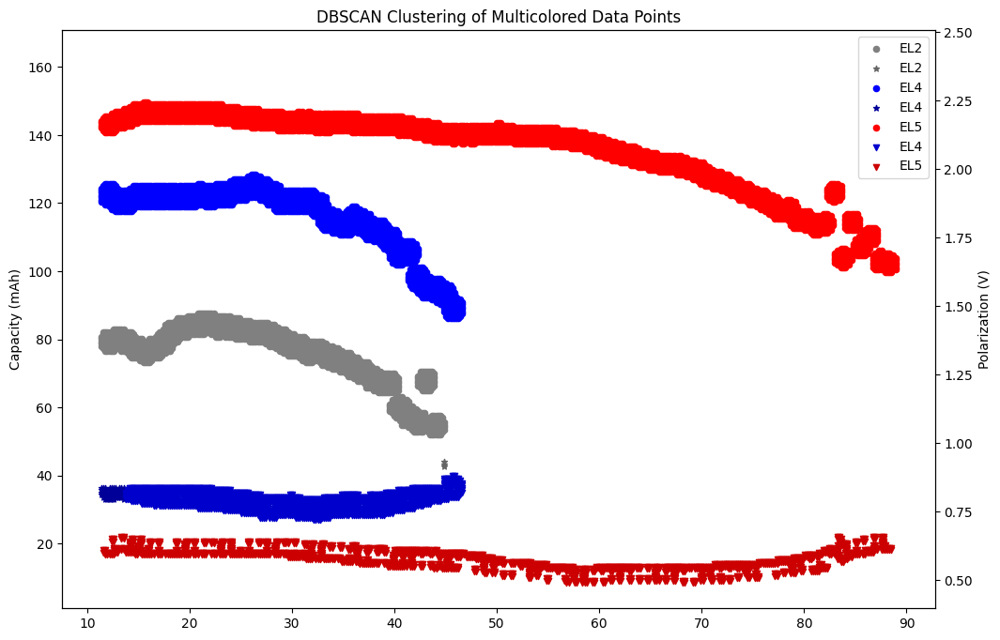

SECOND RANGE
SECOND Y MIN 0.5
SECOND Y MAX 2.5
SEMANTIC SECOND Y MIN 0.5
SEMANTIC SECOND Y MAX 2.5
SECOND Y
OCR DIFF -197.8063861168921
SEM DIFF 2.0
OCR RATIO -98.90319305844605
PIXEL DIFF -48.031562842428684
REAL DIFF FROM BASE POINT 0.48564218562736206
SECOND Y_MIN 0.014357814372637945
SECOND Y_MAX 2.521860275425097
{'topLeft': (80, 32), 'bottomRight': (577, 280)}


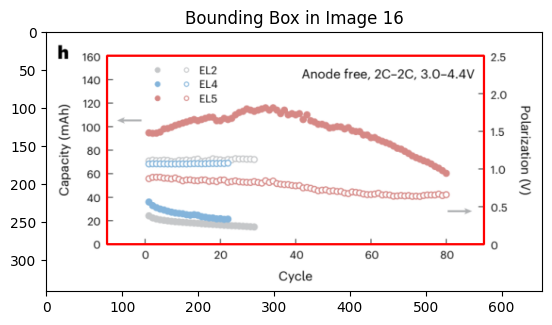

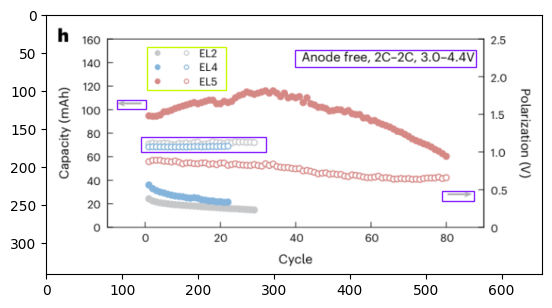

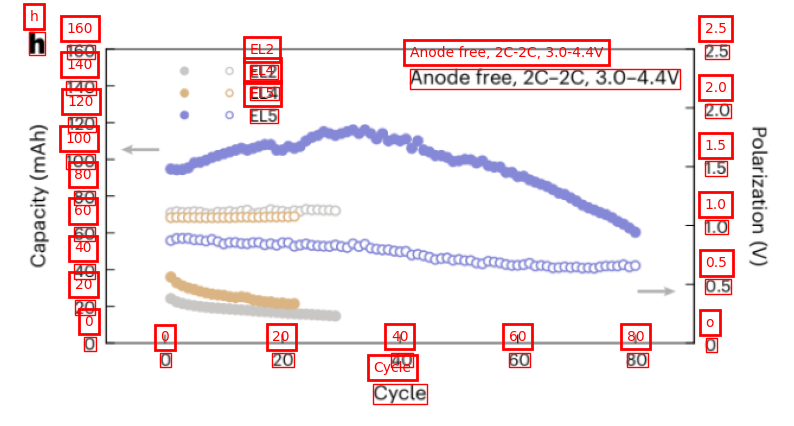

Y MIN 0
Y MAX 160
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 160.0
Y
OCR DIFF -246.66729724779725
SEM DIFF 160.0
OCR RATIO -1.5416706077987328
PIXEL DIFF 0.7380078732967377
REAL DIFF FROM BASE POINT -0.478706585935694
Y_MIN 0.478706585935694
Y_MAX 161.34316021530447
SEMANTIC X MIN 0.0
SEMANTIC X MAX 80.0
X
OCR DIFF 461.7417592462152
SEM DIFF 80.0
OCR RATIO 0.1732570173652877
PIXEL DIFF -13.080449594184756
REAL DIFF FROM BASE POINT -2.2662796824854388
X_MIN 2.2662796824854388
X_MAX 88.37501731303342
X
Predicted [2.2662796824854388, 88.37501731303342]
Chat GPT [0, 80]
Y
Predicted [0.478706585935694, 161.34316021530447]
Chat GPT [0, 160]


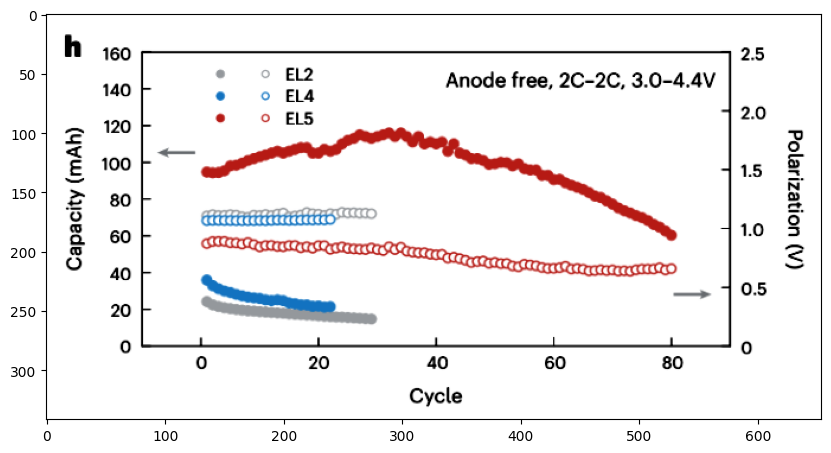

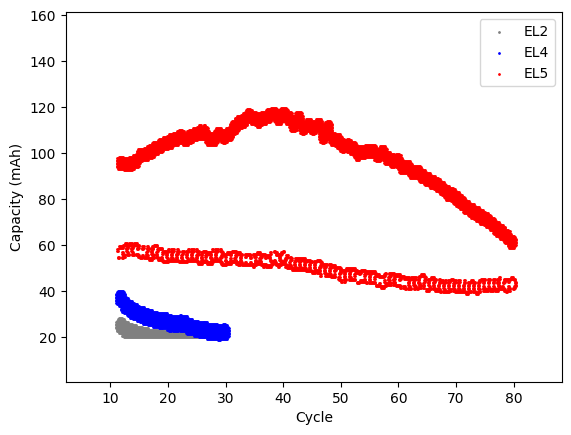

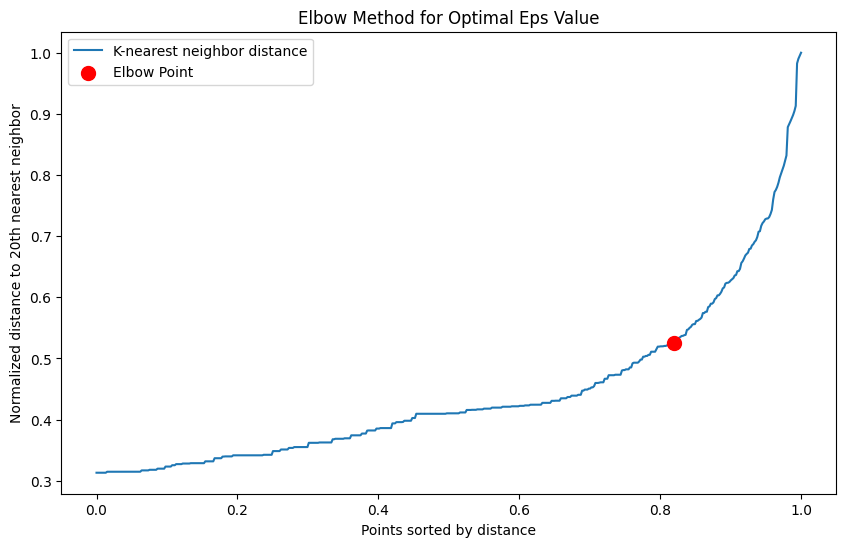

Number of clusters: 1
Number of outliers: 0


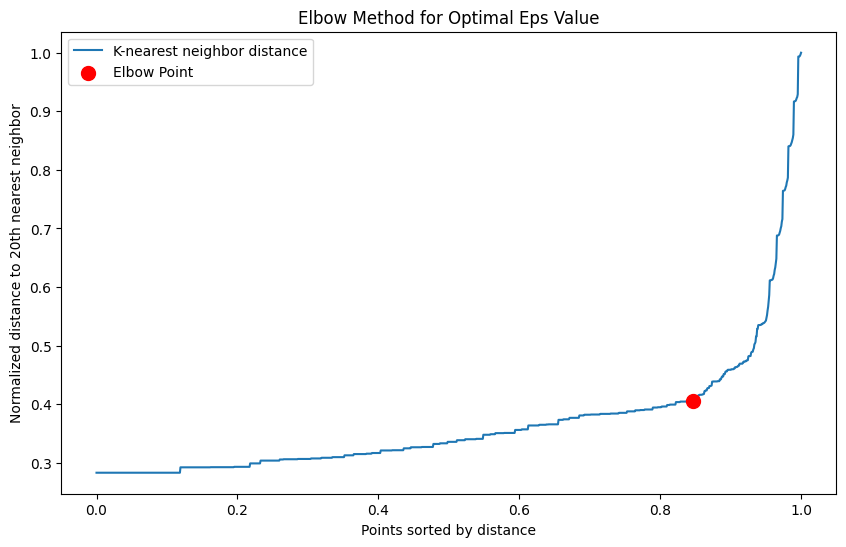

Number of clusters: 2
Number of outliers: 37
Silhouette_score: 0.3977827992653329


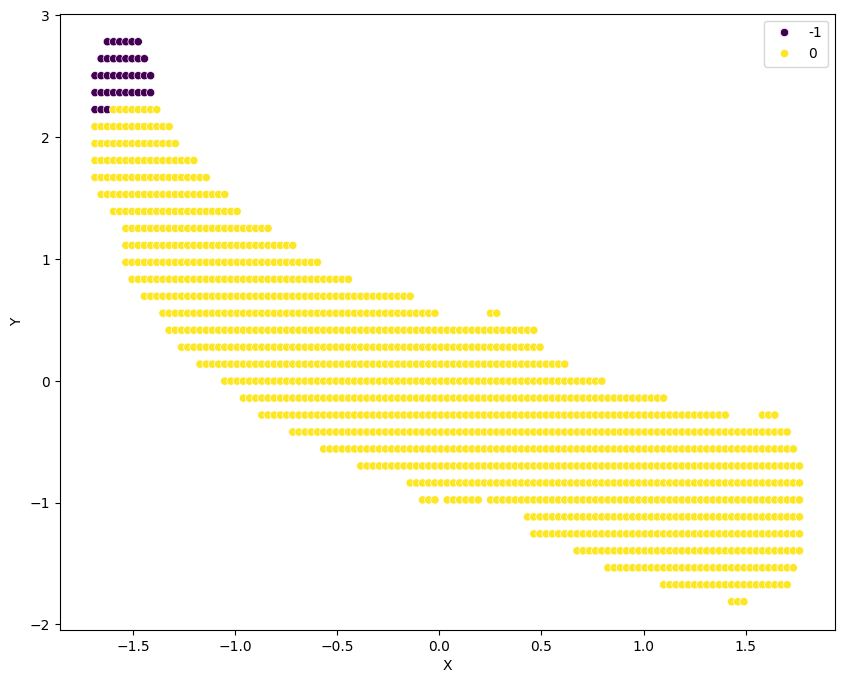

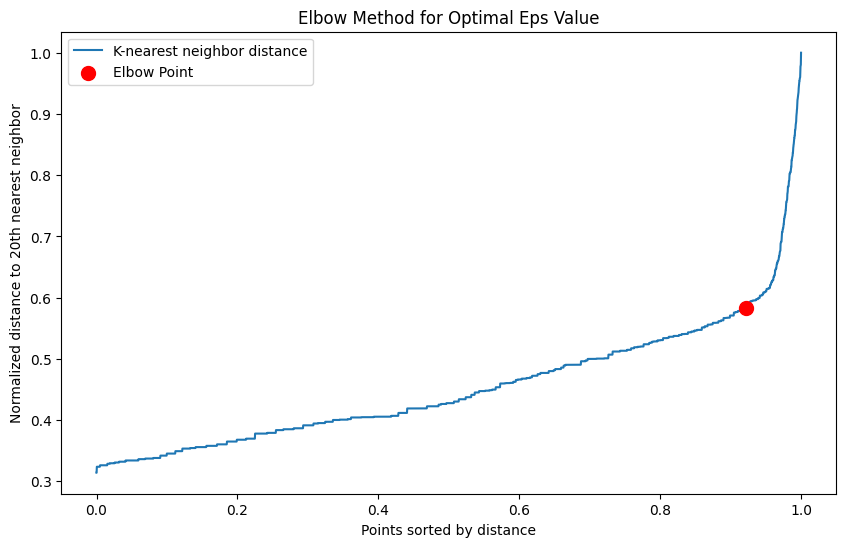

Number of clusters: 2
Number of outliers: 0
Silhouette_score: 0.43428531758685807
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0

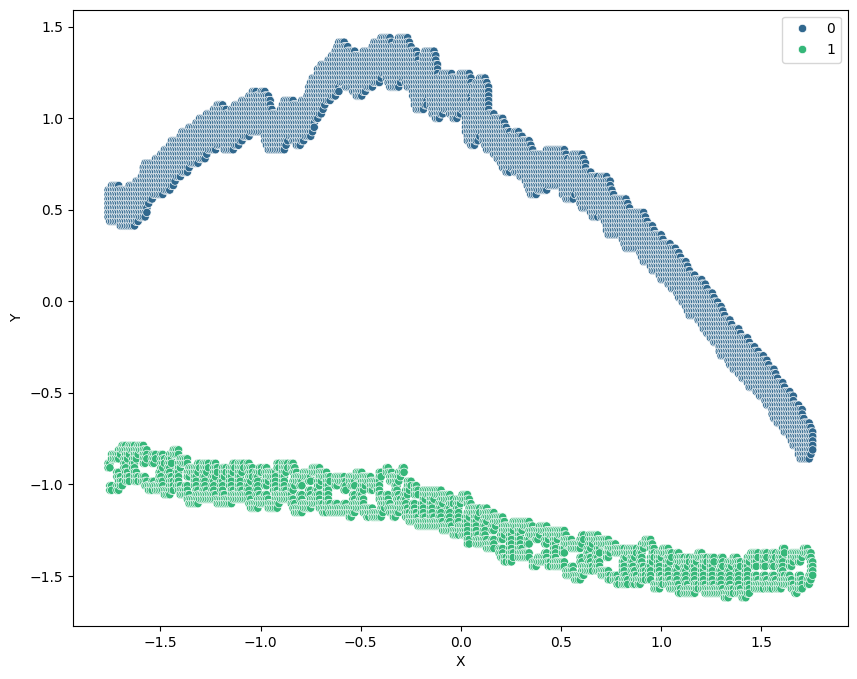

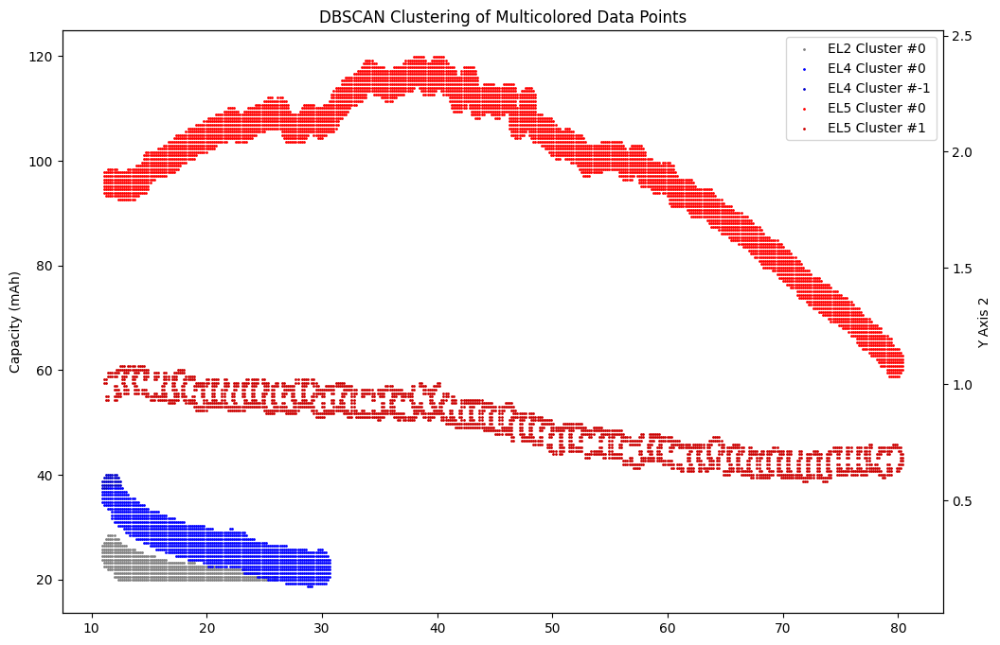

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 

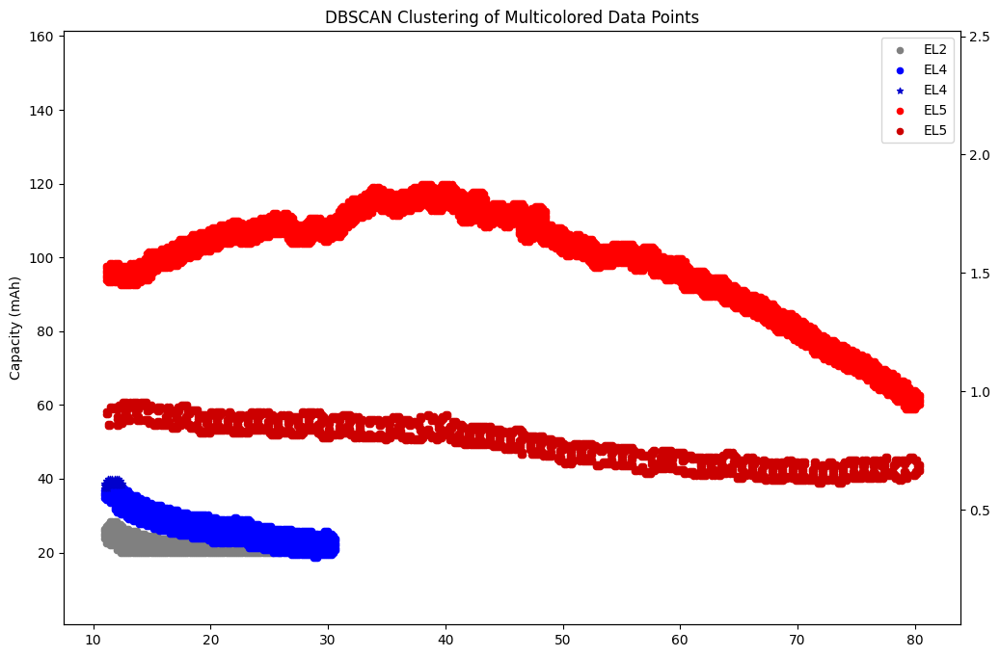

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
SECOND RANGE
SECOND Y MIN 0.2
SECOND Y MAX 1.4
SEMANTIC SECOND Y MIN 0.2
SEMANTIC SECOND Y MAX 1.4
SECOND Y
OCR DIFF -250.2919090501964
SEM DIFF 1.2
OCR RATIO -208.57659087516367
PIXEL DIFF -41.627607487142086
REAL DIFF FROM BASE POINT 0.19957947971283535
SECOND Y_MIN 0.0004205202871646607
SECOND Y_MAX 1.4003858700649188
{'topLeft': [87, 26], 'bottomRight': [380, 318]

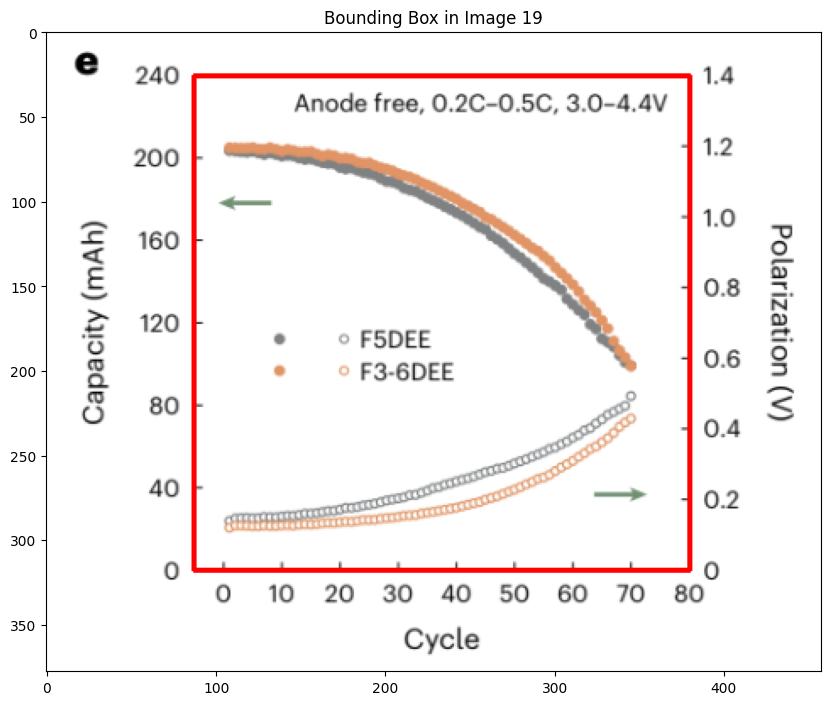

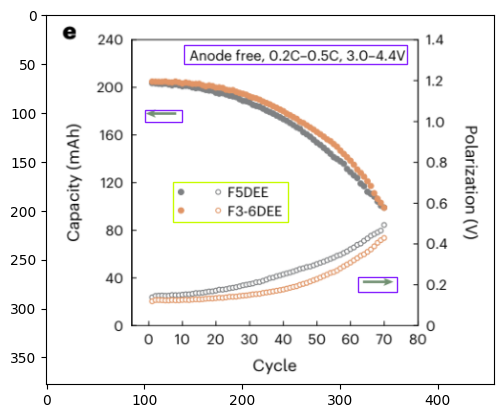

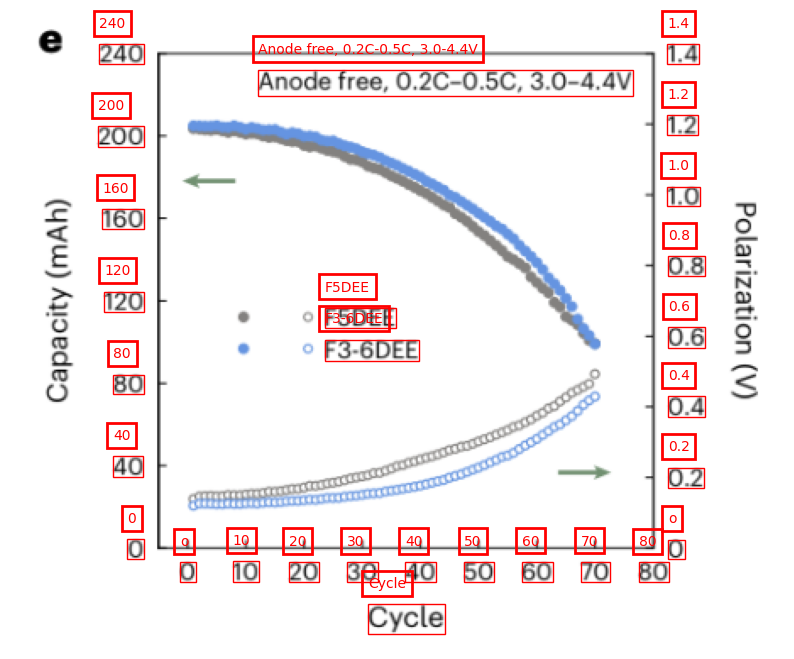

Y MIN 0
Y MAX 240
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 240.0
Y
OCR DIFF -292.61655566096306
SEM DIFF 240.0
OCR RATIO -1.2192356485873461
PIXEL DIFF 0.5369644537568092
REAL DIFF FROM BASE POINT -0.44041072320921487
Y_MIN 0.44041072320921487
Y_MAX 239.93472040675775
SEMANTIC X MIN 0.0
SEMANTIC X MAX 80.0
X
OCR DIFF 306.0719712153077
SEM DIFF 80.0
OCR RATIO 0.2613764327466746
PIXEL DIFF -13.160181682556868
REAL DIFF FROM BASE POINT -3.4397613424848443
X_MIN 3.4397613424848443
X_MAX 80.0230561372605
X
Predicted [3.4397613424848443, 80.0230561372605]
Chat GPT [0, 80]
Y
Predicted [0.44041072320921487, 239.93472040675775]
Chat GPT [0, 240]


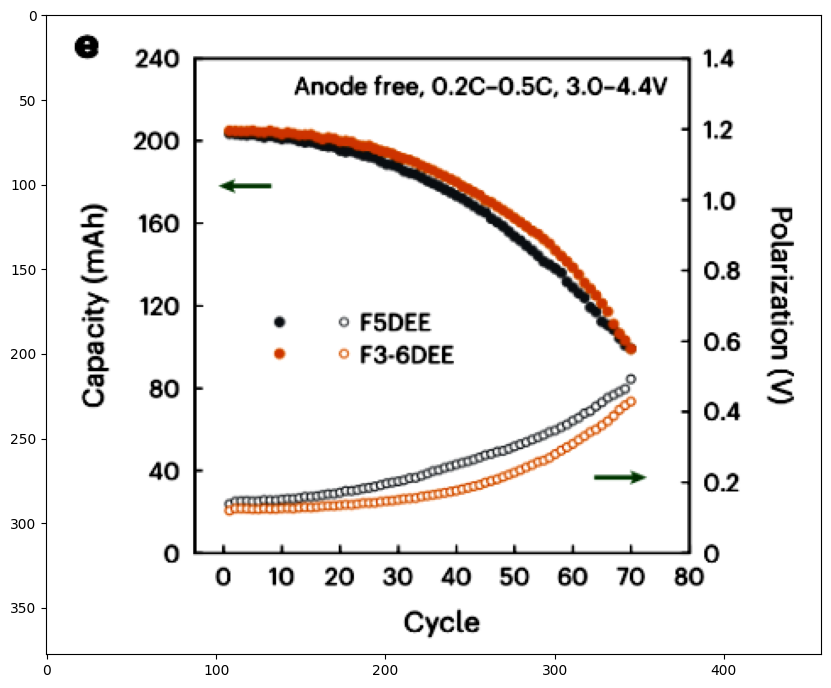

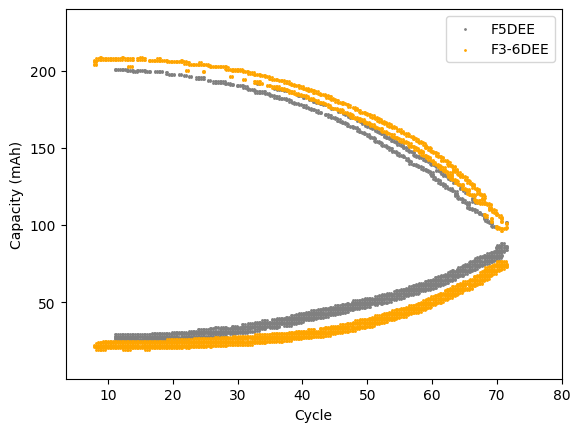

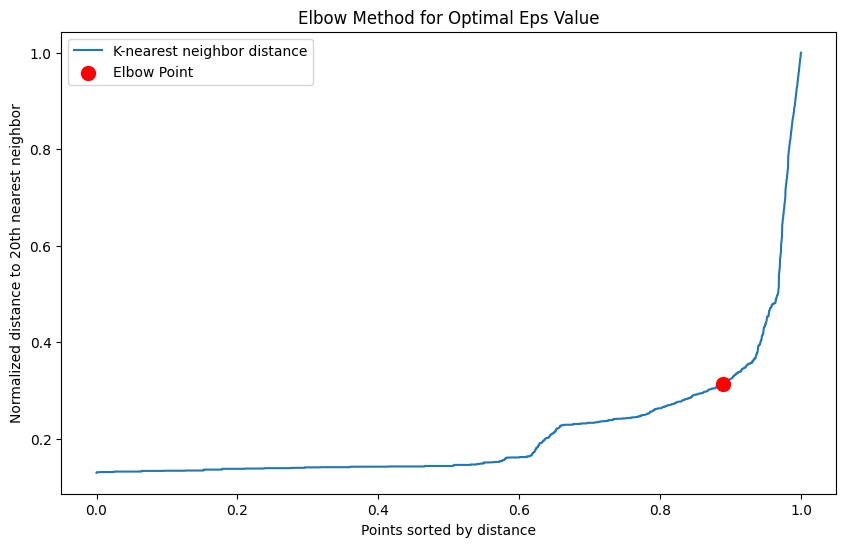

Number of clusters: 2
Number of outliers: 141
Silhouette_score: 0.4103024624021795


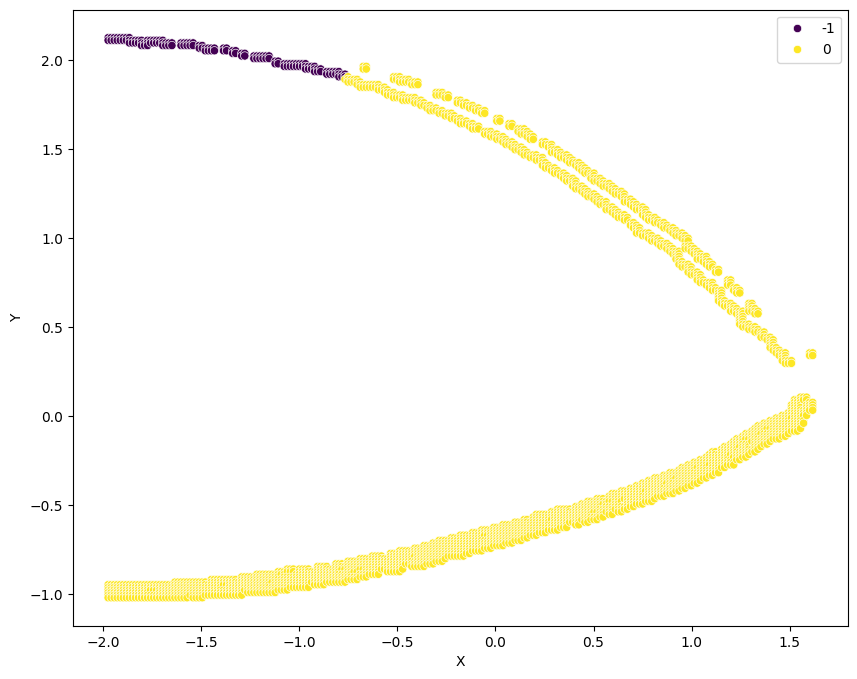

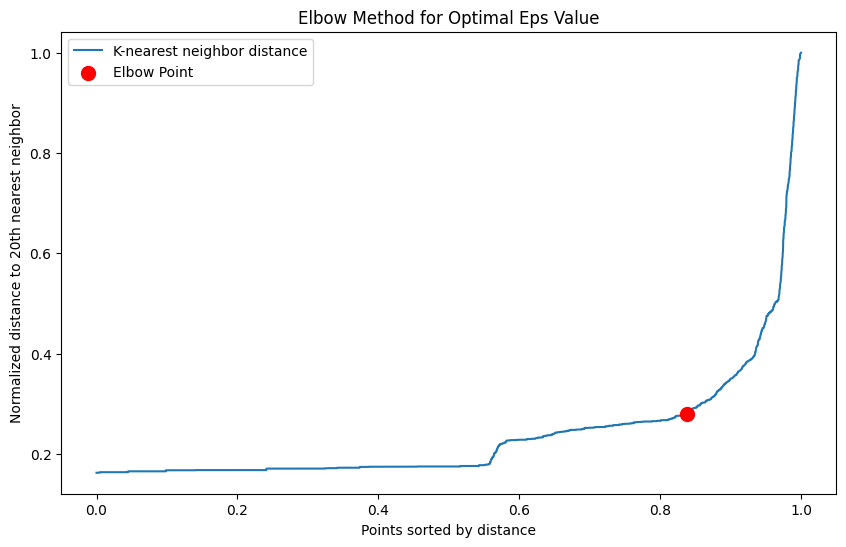

Number of clusters: 3
Number of outliers: 246
Silhouette_score: 0.44854916330089245
[-1 -1  0 ...  0  0  0]
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
[-1 -1 -1 ...  0  0  0]
(1.0, 0.6470588235294118, 0.0)
(0.8, 0.5176470588235295, 0.0)
(0.6, 0.3882352941176471, 0.0)


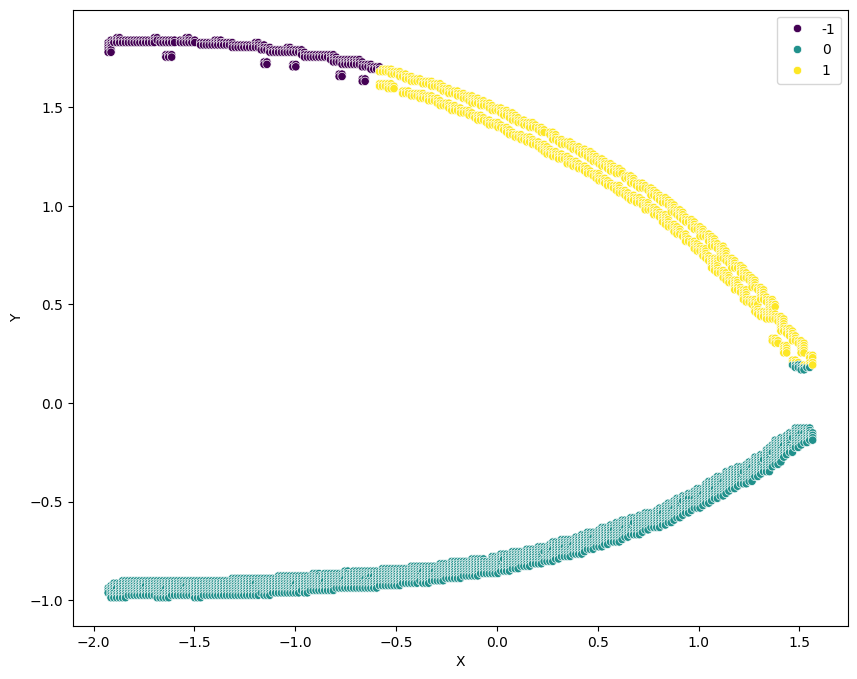

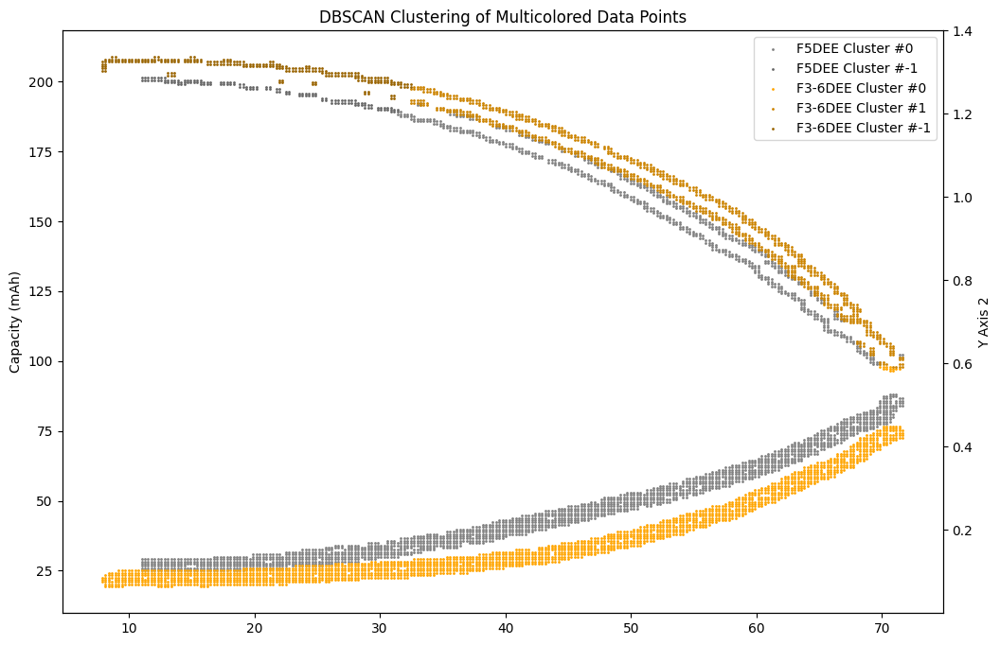

[-1 -1  0 ...  0  0  0]
Color (0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
Label F5DEE Cluster #0
Marker o
Color (0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
Label F5DEE Cluster #-1
Marker *
[-1 -1 -1 ...  0  0  0]
Color (1.0, 0.6470588235294118, 0.0)
Label F3-6DEE Cluster #0
Marker v
Color (0.8, 0.5176470588235295, 0.0)
Label F3-6DEE Cluster #1
Marker v
Color (0.6, 0.3882352941176471, 0.0)
Label F3-6DEE Cluster #-1
Marker *



A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


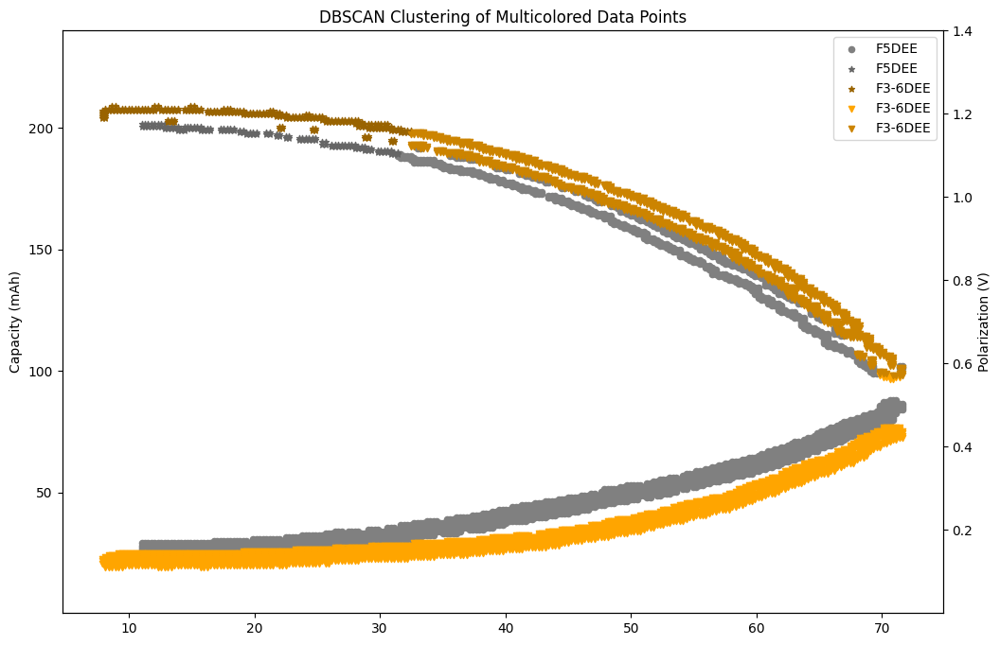

SECOND RANGE
SECOND Y MIN 70
SECOND Y MAX 1.6
SEMANTIC SECOND Y MIN 70.0
SEMANTIC SECOND Y MAX 1.6
SECOND Y
OCR DIFF -306.7230302095413
SEM DIFF -68.4
OCR RATIO 4.484254827624873
PIXEL DIFF 13.709480285644531
REAL DIFF FROM BASE POINT 3.0572482636777103
SECOND Y_MIN 66.9427517363223
SECOND Y_MAX 1.603021666791392
{'topLeft': (79, 29), 'bottomRight': (372, 322)}


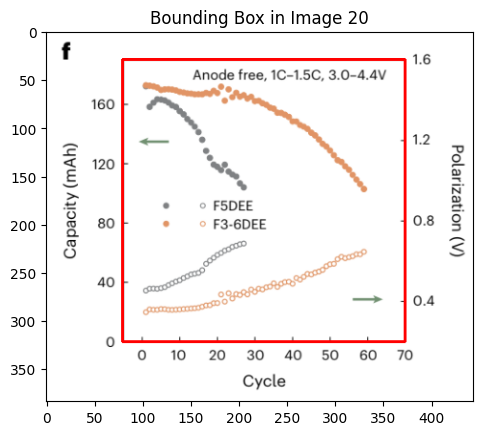

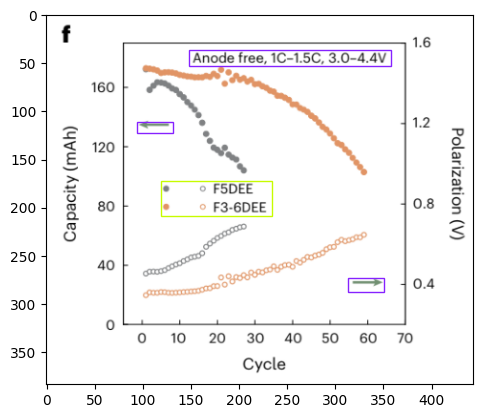

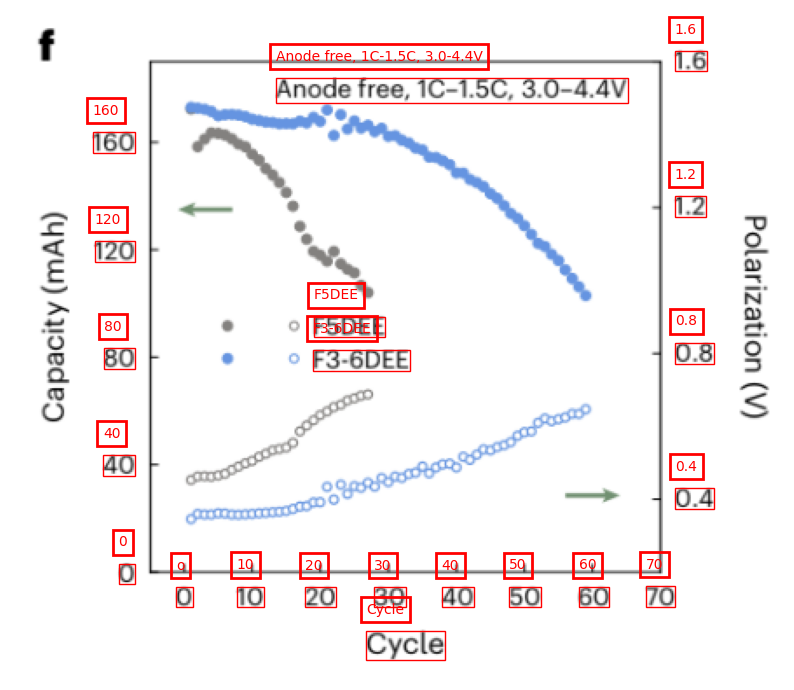

Y MIN 0
Y MAX 160
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 160.0
Y
OCR DIFF -246.83155810832977
SEM DIFF 160.0
OCR RATIO -1.5426972381770612
PIXEL DIFF 0.6316367387771606
REAL DIFF FROM BASE POINT -0.4094366173388231
Y_MIN 0.4094366173388231
Y_MAX 190.33652843363421
SEMANTIC X MIN 0.0
SEMANTIC X MAX 70.0
X
OCR DIFF 305.58698357641697
SEM DIFF 70.0
OCR RATIO 0.22906734829068845
PIXEL DIFF -12.500037156045437
REAL DIFF FROM BASE POINT -2.863350364870407
X_MIN 2.863350364870407
X_MAX 69.98008341404213
X
Predicted [2.863350364870407, 69.98008341404213]
Chat GPT [0, 70]
Y
Predicted [0.4094366173388231, 190.33652843363421]
Chat GPT [0, 160]


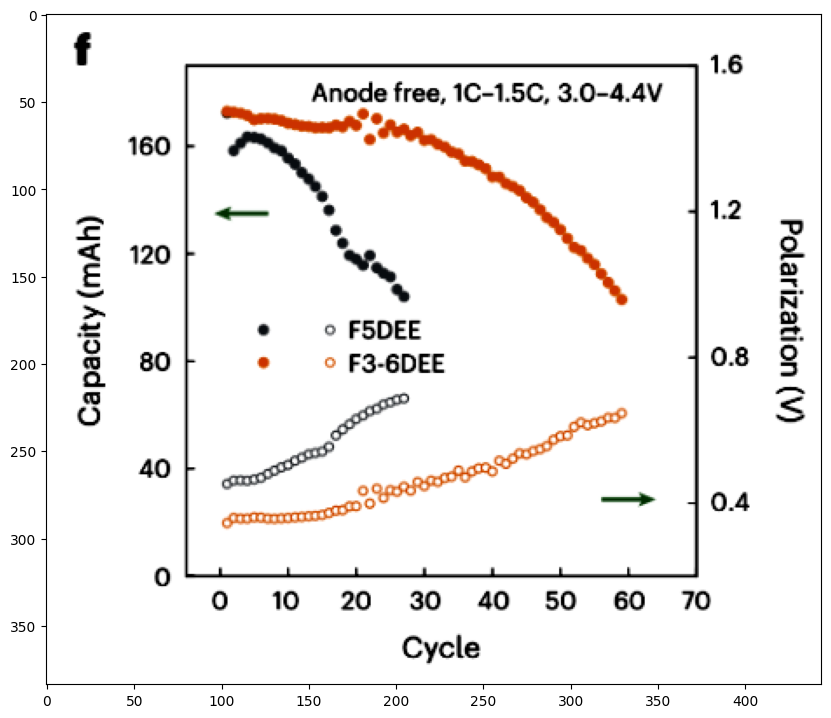

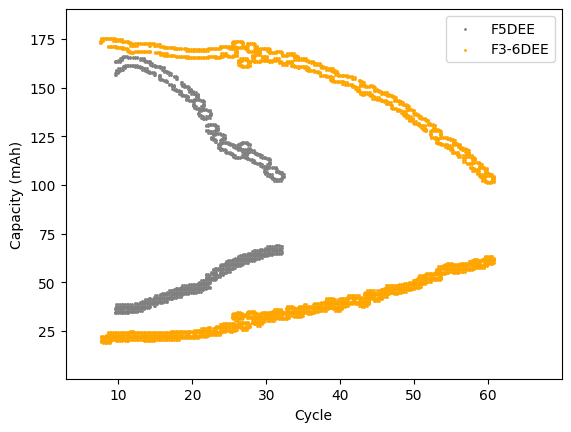

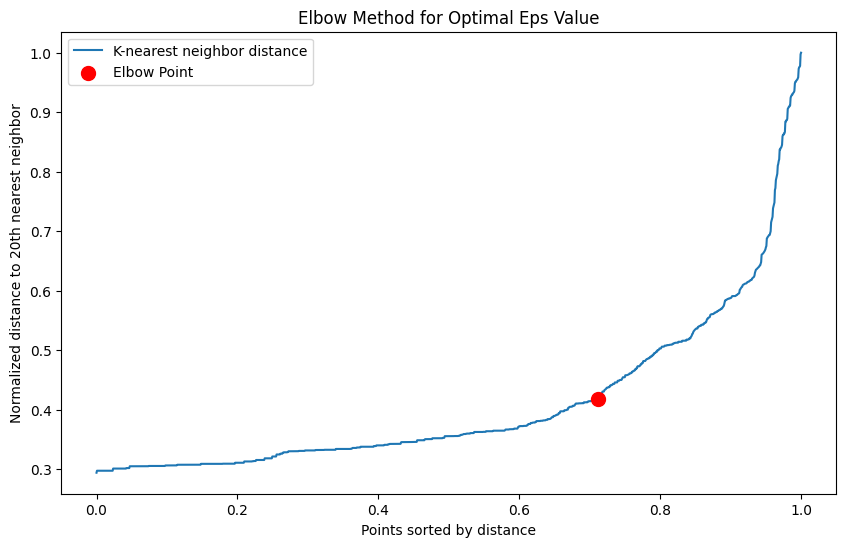

Number of clusters: 3
Number of outliers: 116
Silhouette_score: 0.4290450498095162


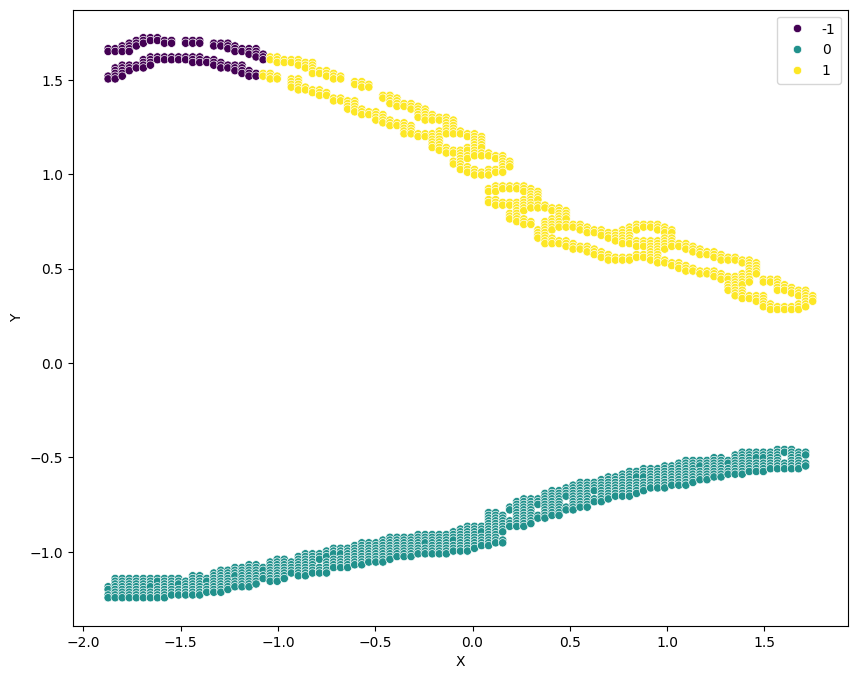

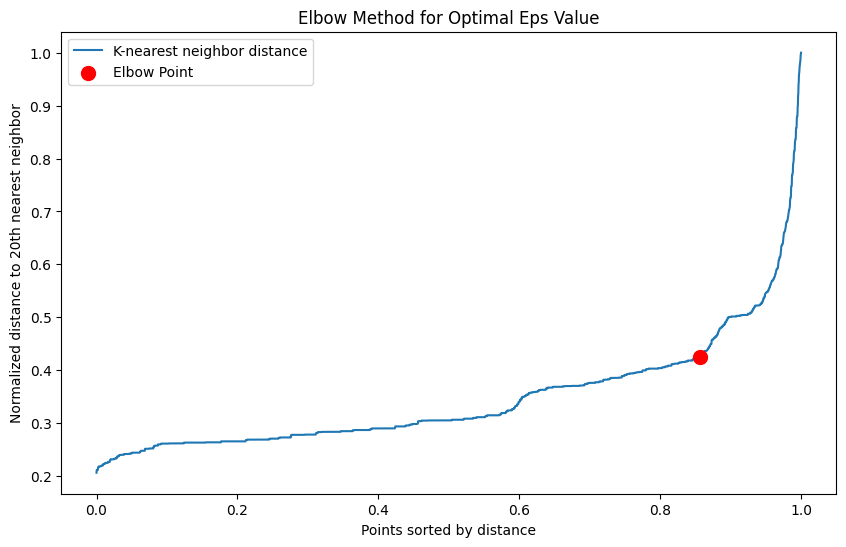

Number of clusters: 3
Number of outliers: 187
Silhouette_score: 0.40976407543061705
[-1 -1 -1 ...  1  1  1]
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
(0.30117647058823527, 0.30117647058823527, 0.30117647058823527)
[-1 -1 -1 ...  0  0  0]
(1.0, 0.6470588235294118, 0.0)
(0.8, 0.5176470588235295, 0.0)
(0.6, 0.3882352941176471, 0.0)


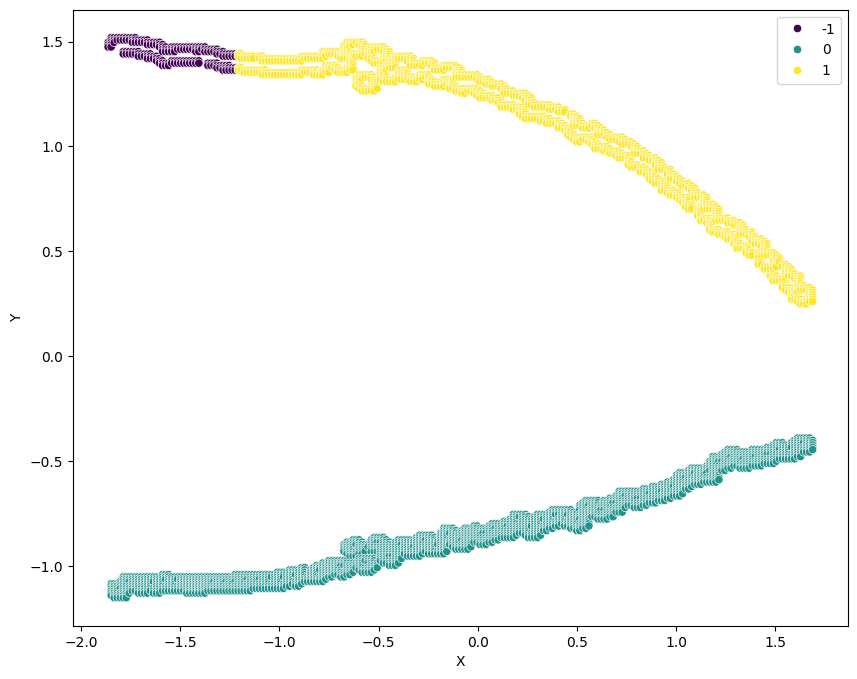

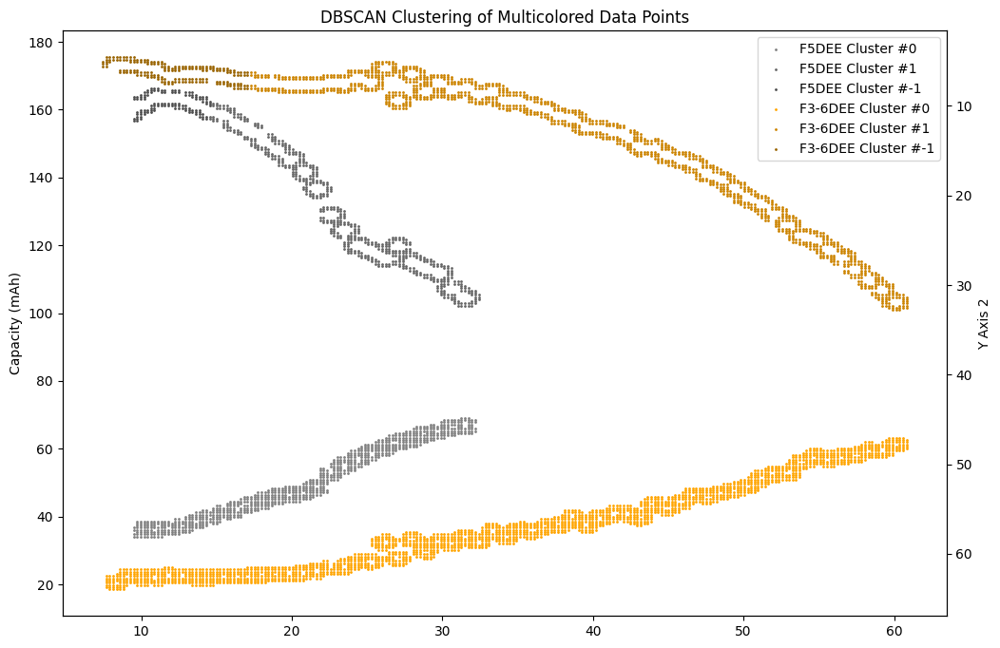

[-1 -1 -1 ...  1  1  1]
Color (0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
Label F5DEE Cluster #0
Marker o
Color (0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
Label F5DEE Cluster #1
Marker o
Color (0.30117647058823527, 0.30117647058823527, 0.30117647058823527)
Label F5DEE Cluster #-1
Marker *
[-1 -1 -1 ...  0  0  0]
Color (1.0, 0.6470588235294118, 0.0)
Label F3-6DEE Cluster #0
Marker v
Color (0.8, 0.5176470588235295, 0.0)
Label F3-6DEE Cluster #1
Marker v
Color (0.6, 0.3882352941176471, 0.0)
Label F3-6DEE Cluster #-1
Marker *



A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


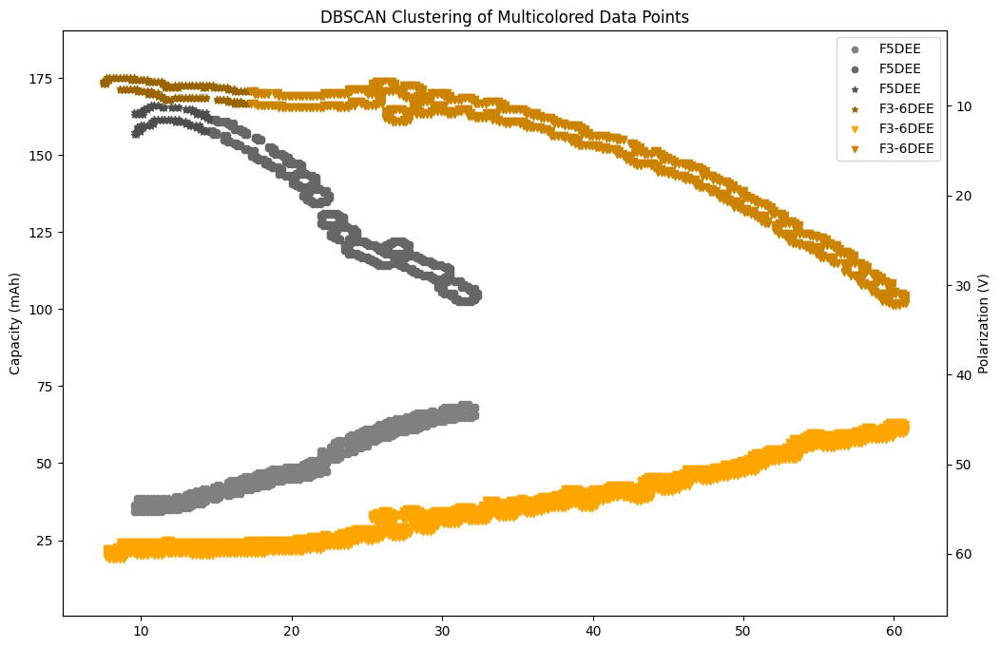

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
SECOND RANGE
SECOND Y MIN 0.4
SECOND Y MAX 1.6
SEMANTIC SECOND Y MIN 0.4
SEMANTIC SECOND Y MAX 1.6
SECOND Y
OCR DIFF -292.5269773826003
SEM DIFF 1.2000000000000002
OCR RATIO -243.77248115216688
PIXEL DIFF -0.45440174639225006
REAL DIFF FROM BASE POINT 0.0018640403717620812
SECOND Y_MIN 0.39813595962823795
SECOND Y_MAX 1.5959742005153572
{'topLeft': [84, 30], 'bottomRi

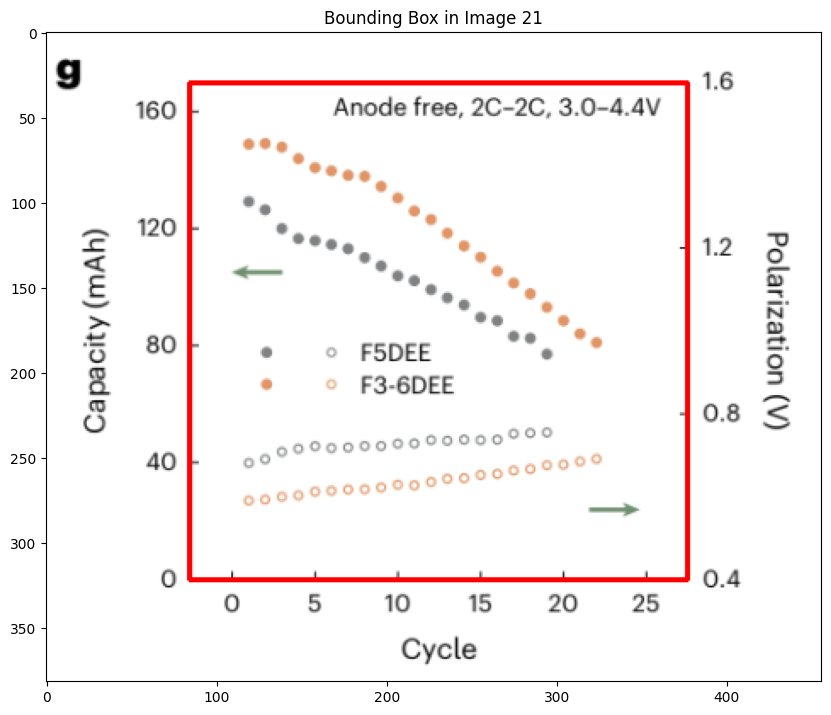

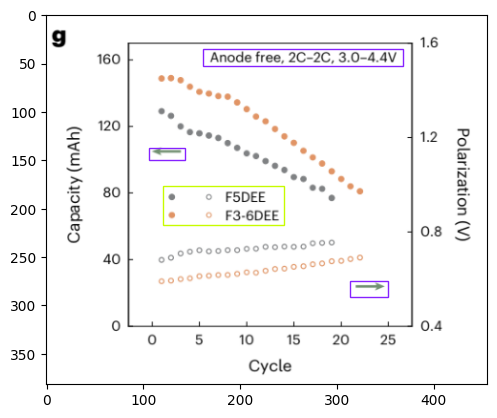

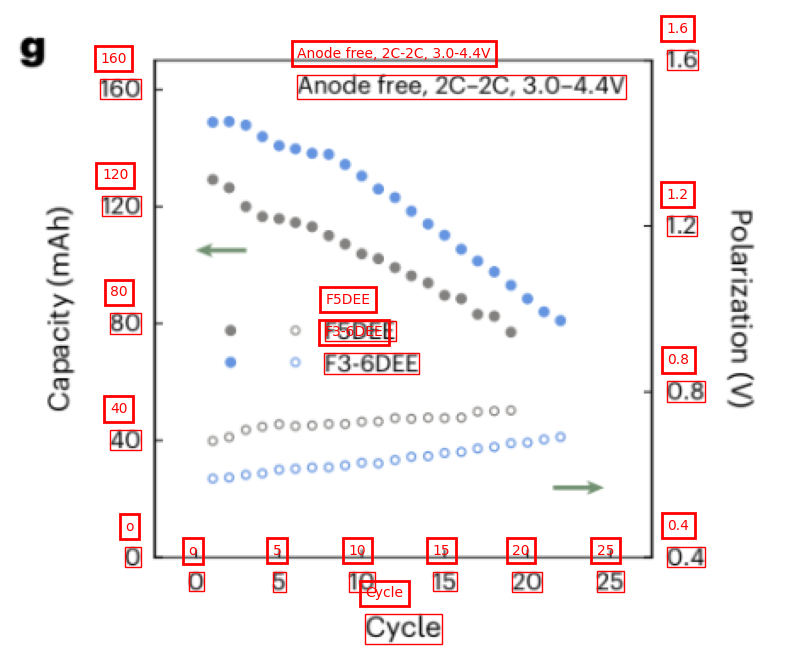

Y MIN 40
Y MAX 160
SEMANTIC Y MIN 40.0
SEMANTIC Y MAX 160.0
Y
OCR DIFF -206.42152911238372
SEM DIFF 120.0
OCR RATIO -1.7201794092698643
PIXEL DIFF -69.26556494086981
REAL DIFF FROM BASE POINT 40.2664771869754
Y_MIN -0.26647718697540057
Y_MAX 169.4832584664355
SEMANTIC X MIN 5.0
SEMANTIC X MAX 25.0
X
OCR DIFF 194.71473714709282
SEM DIFF 20.0
OCR RATIO 0.10271436200995641
PIXEL DIFF 73.97851900756359
REAL DIFF FROM BASE POINT 7.598656382303329
X_MIN -2.5986563823033286
X_MAX 27.4966516866139
X
Predicted [-2.5986563823033286, 27.4966516866139]
Chat GPT [0, 25]
Y
Predicted [-0.26647718697540057, 169.4832584664355]
Chat GPT [40, 160]


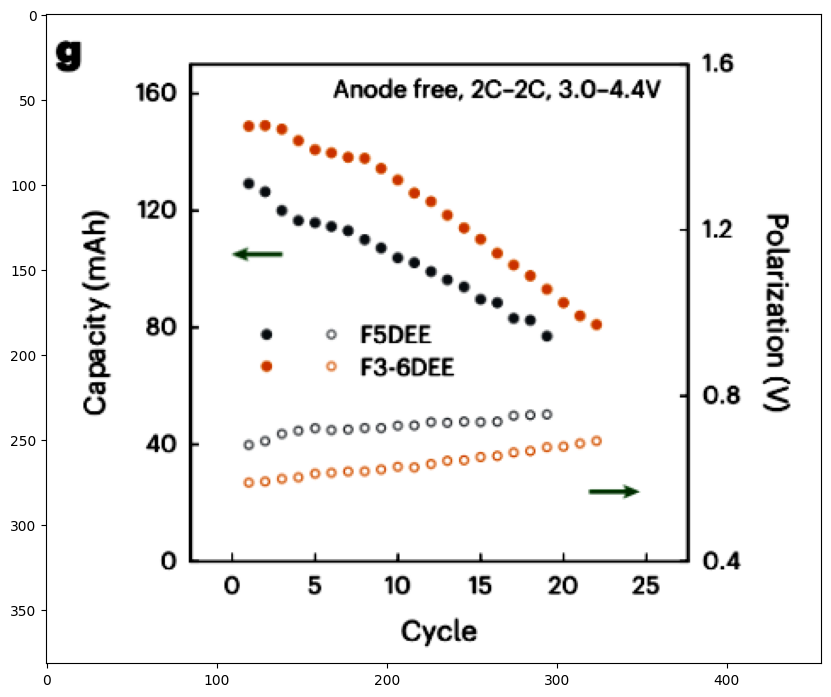

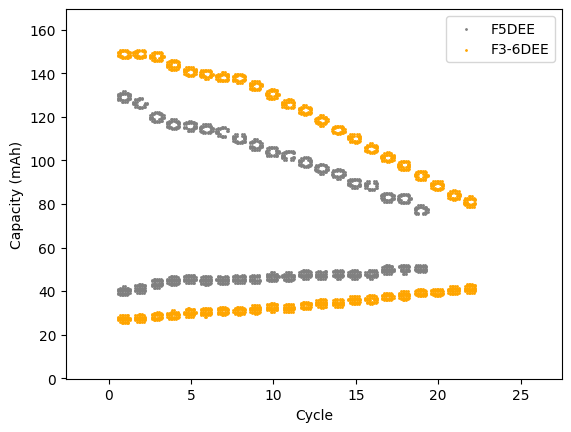

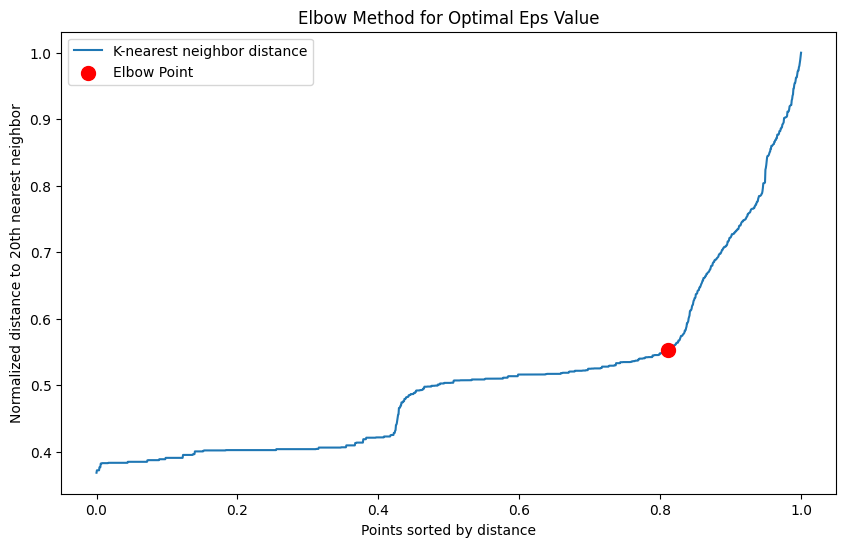

Number of clusters: 2
Number of outliers: 0
Silhouette_score: 0.47139655583345036


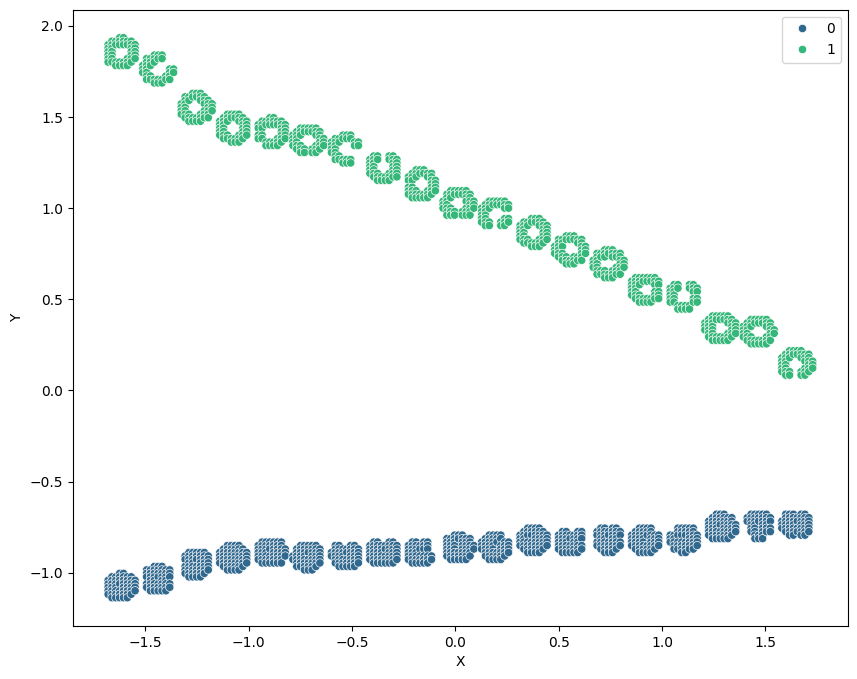

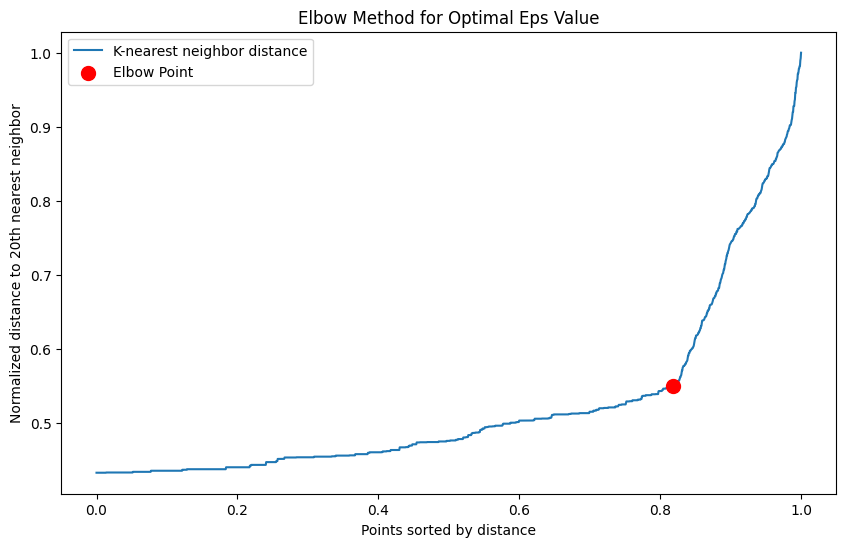

Number of clusters: 2
Number of outliers: 0
Silhouette_score: 0.4692582649235264
[1 1 1 ... 1 1 1]
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
[1 1 1 ... 0 0 0]
(1.0, 0.6470588235294118, 0.0)
(0.8, 0.5176470588235295, 0.0)


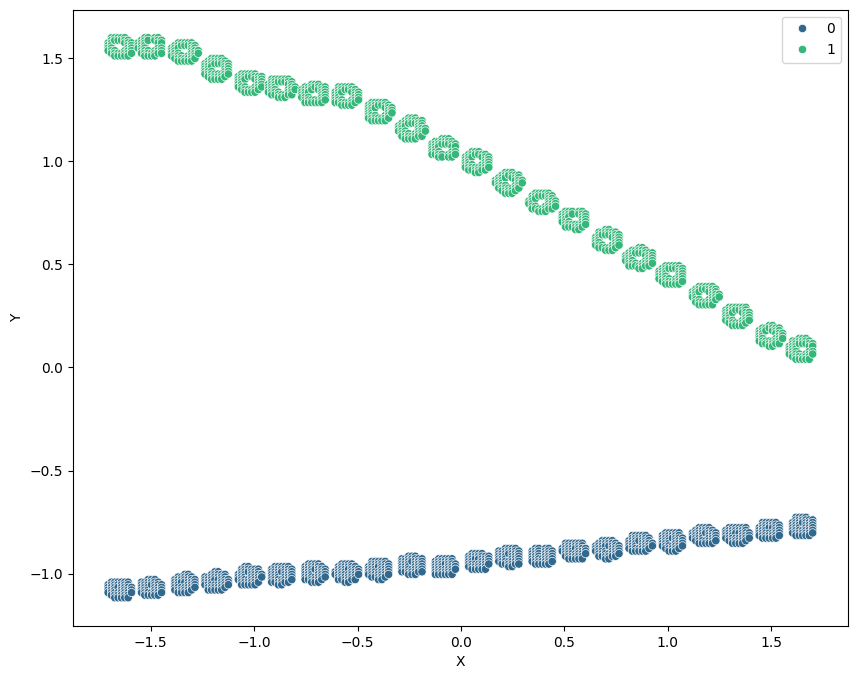

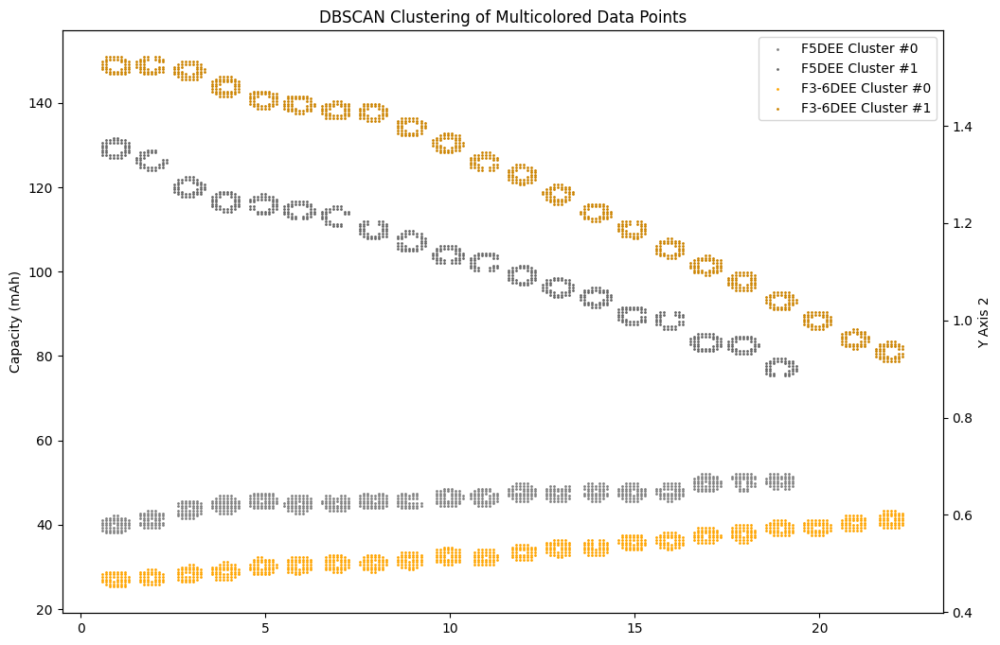

[1 1 1 ... 1 1 1]
Color (0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
Label F5DEE Cluster #0
Marker o
Color (0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
Label F5DEE Cluster #1
Marker o
[1 1 1 ... 0 0 0]
Color (1.0, 0.6470588235294118, 0.0)
Label F3-6DEE Cluster #0
Marker v
Color (0.8, 0.5176470588235295, 0.0)
Label F3-6DEE Cluster #1
Marker v



A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


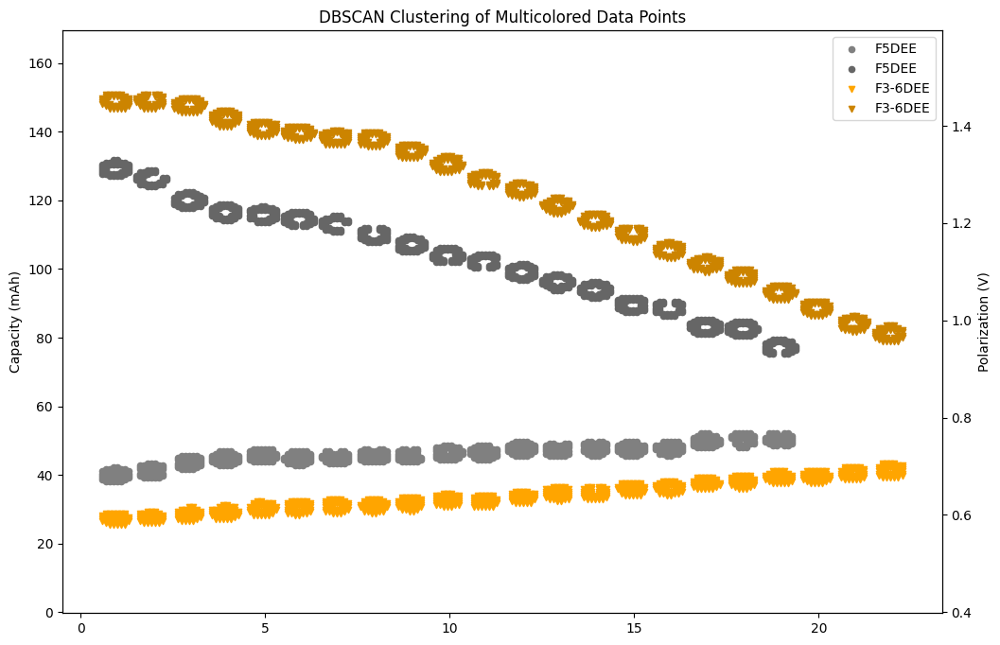

SECOND RANGE
SECOND Y MIN 20
SECOND Y MAX 110
SEMANTIC SECOND Y MIN 20.0
SEMANTIC SECOND Y MAX 110.0
SECOND Y
OCR DIFF -519.9662301316857
SEM DIFF 90.0
OCR RATIO -5.77740255701873
PIXEL DIFF -2.1027585566043854
REAL DIFF FROM BASE POINT 0.36396261743087815
SECOND Y_MIN 19.63603738256912
SECOND Y_MAX 109.81497071084453
{'topLeft': (175, 28), 'bottomRight': (1219, 549)}


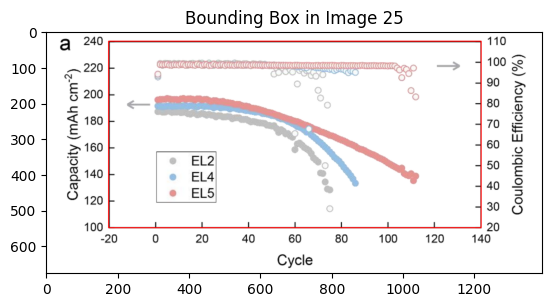

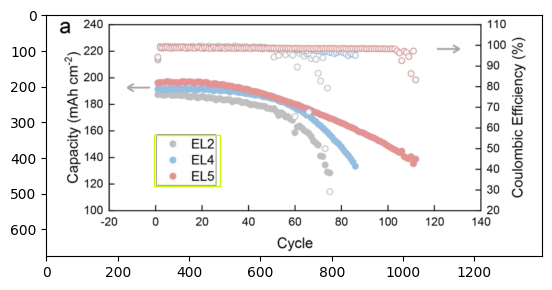

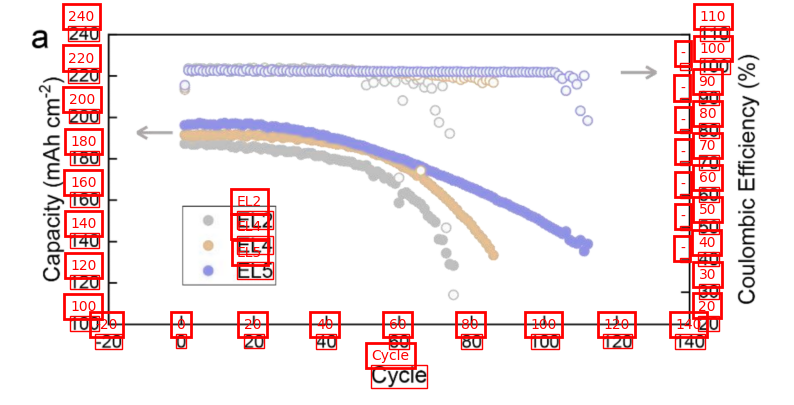

Y MIN 100
Y MAX 240
SEMANTIC Y MIN 100.0
SEMANTIC Y MAX 240.0
Y
OCR DIFF -519.5225781053305
SEM DIFF 140.0
OCR RATIO -3.7108755578952177
PIXEL DIFF -2.300386890769005
REAL DIFF FROM BASE POINT 0.619904077859665
Y_MIN 99.38009592214034
Y_MAX 239.77822888877301
SEMANTIC X MIN -20.0
SEMANTIC X MAX 140.0
X
OCR DIFF 1043.5642710700631
SEM DIFF 160.0
OCR RATIO 0.15332069565388357
PIXEL DIFF 1.061048749834299
REAL DIFF FROM BASE POINT 0.1626807324472782
X_MIN -20.162680732447278
X_MAX 139.90412553020715
X
Predicted [-20.162680732447278, 139.90412553020715]
Chat GPT [-20, 140]
Y
Predicted [99.38009592214034, 239.77822888877301]
Chat GPT [100, 240]


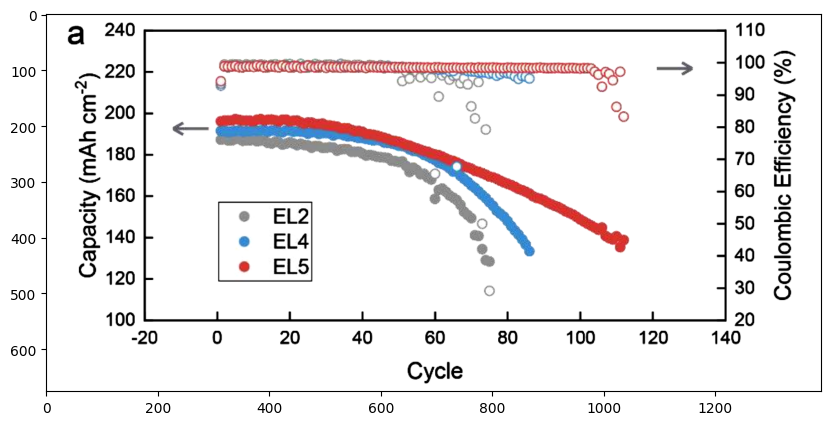

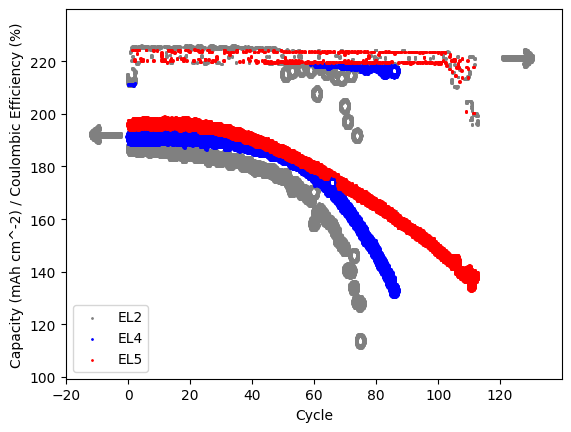

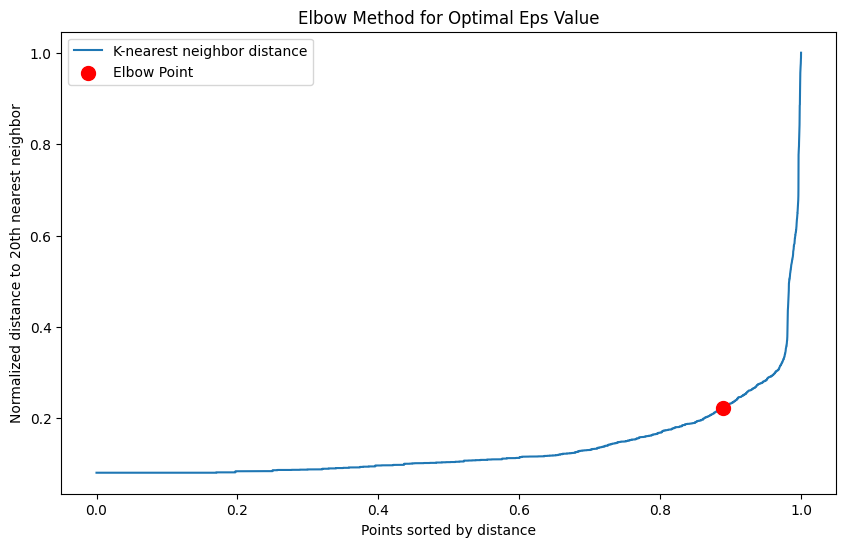

Number of clusters: 8
Number of outliers: 1002
Silhouette_score: 0.15020893548664127


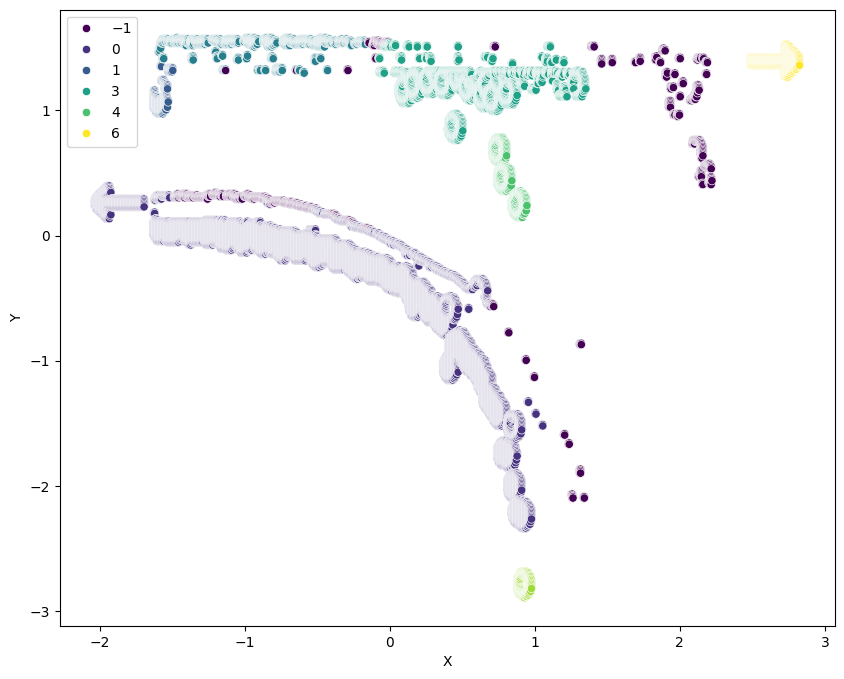

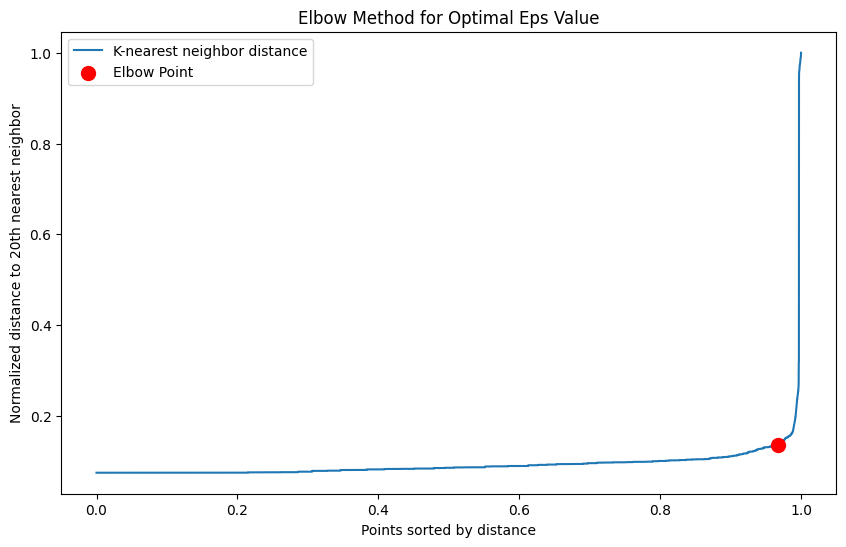

Number of clusters: 3
Number of outliers: 137
Silhouette_score: 0.33617167885066396


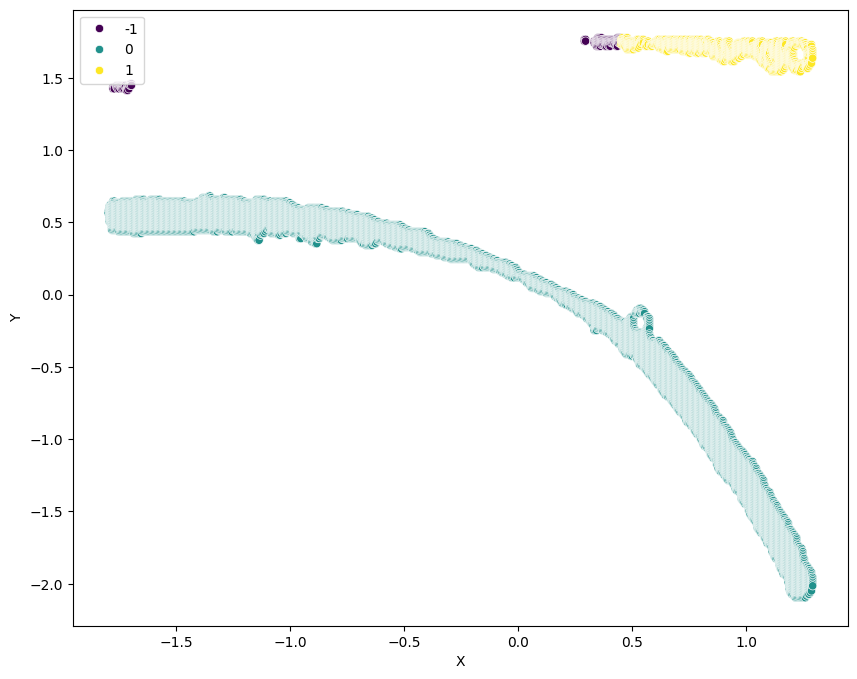

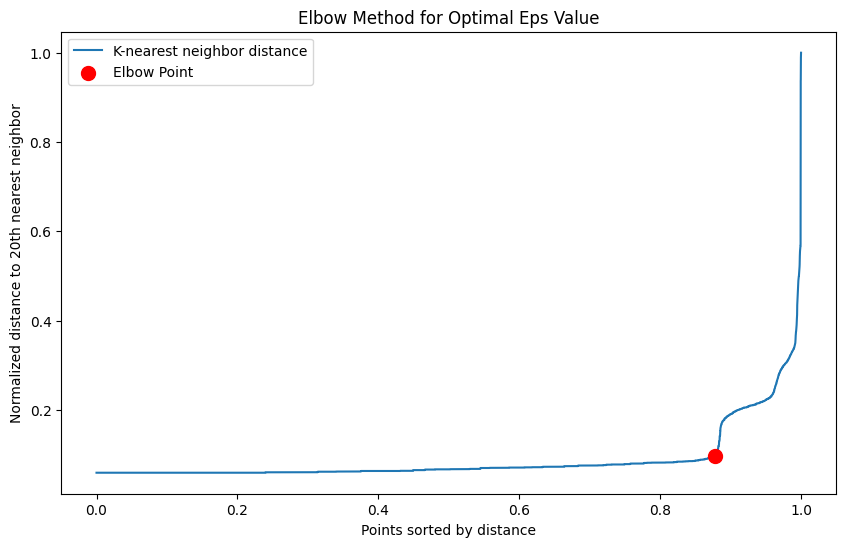

Number of clusters: 2
Number of outliers: 1713
Silhouette_score: 0.3560056570364864
[0 0 0 ... 6 6 6]
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
(0.30117647058823527, 0.30117647058823527, 0.30117647058823527)
(0.20078431372549016, 0.20078431372549016, 0.20078431372549016)
(0.10039215686274508, 0.10039215686274508, 0.10039215686274508)
(0.0, 0.0, 0.0)
(0, 0, 0)
(0, 0, 0)
[0 0 0 ... 0 0 0]
(0.0, 0.0, 1.0)
(0.0, 0.0, 0.8)
(0.0, 0.0, 0.6)
[0 0 0 ... 0 0 0]
(1.0, 0.0, 0.0)
(0.8, 0.0, 0.0)


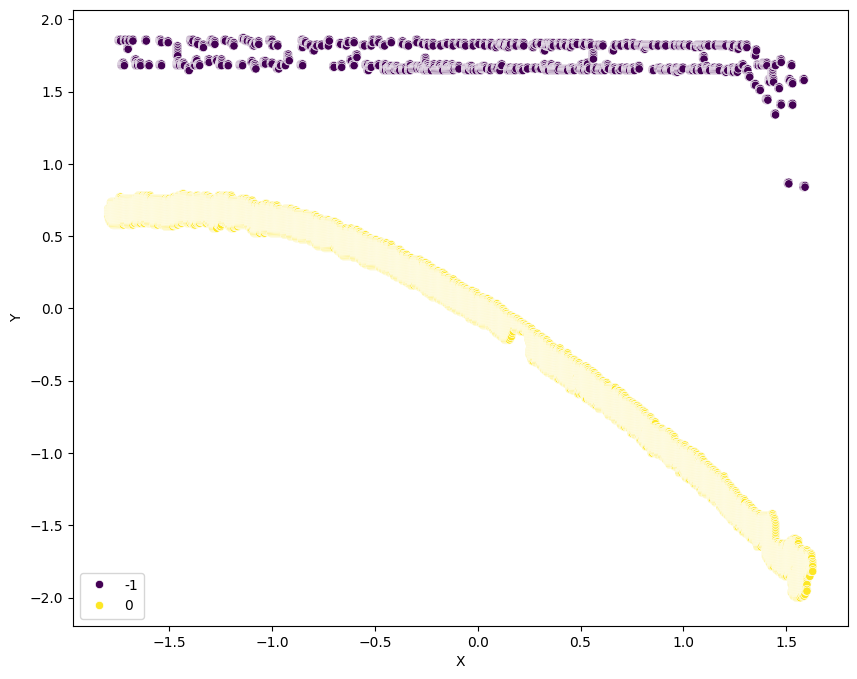

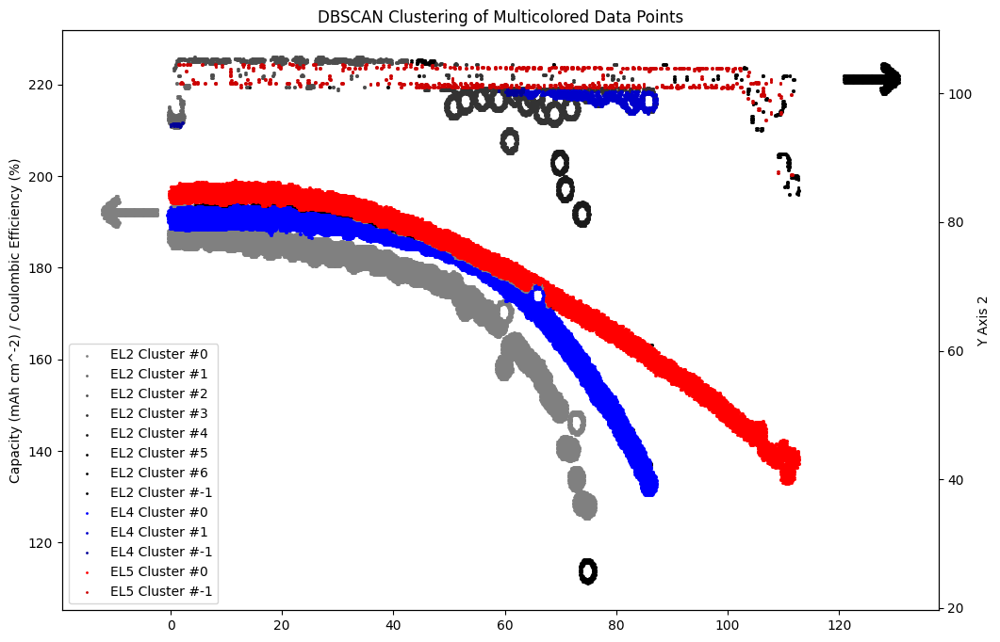

[0 0 0 ... 6 6 6]
Color (0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
Label EL2 Cluster #0
Marker o
Color (0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
Label EL2 Cluster #1
Marker o
Color (0.30117647058823527, 0.30117647058823527, 0.30117647058823527)
Label EL2 Cluster #2
Marker *
Color (0.20078431372549016, 0.20078431372549016, 0.20078431372549016)
Label EL2 Cluster #3
Marker *
Color (0.10039215686274508, 0.10039215686274508, 0.10039215686274508)
Label EL2 Cluster #4
Marker *
Color (0.0, 0.0, 0.0)
Label EL2 Cluster #5
Marker *
Color (0, 0, 0)
Label EL2 Cluster #6
Marker *
Color (0, 0, 0)
Label EL2 Cluster #-1
Marker *
[0 0 0 ... 0 0 0]
Color (0.0, 0.0, 1.0)
Label EL4 Cluster #0
Marker *
Color (0.0, 0.0, 0.8)
Label EL4 Cluster #1
Marker *
Color (0.0, 0.0, 0.6)
Label EL4 Cluster #-1
Marker *
[0 0 0 ... 0 0 0]
Color (1.0, 0.0, 0.0)
Label EL5 Cluster #0
Marker *
Color (0.8, 0.0, 0.0)
Label EL5 Cluster #-1
Marker *


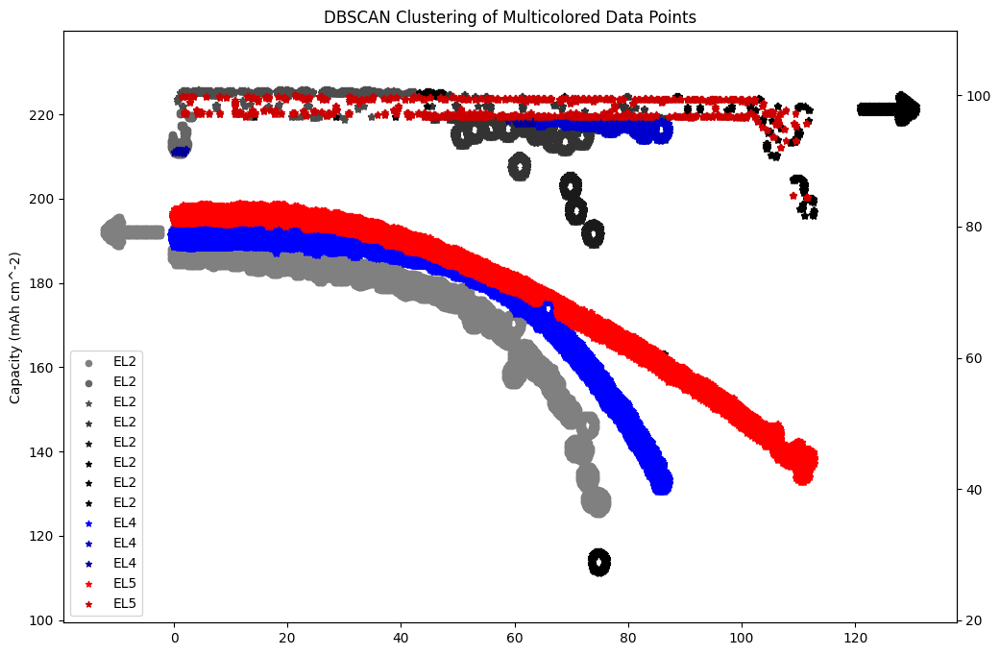

SECOND RANGE
SECOND Y MIN 20
SECOND Y MAX 110
SEMANTIC SECOND Y MIN 20.0
SEMANTIC SECOND Y MAX 110.0
SECOND Y
OCR DIFF -519.720013961196
SEM DIFF 90.0
OCR RATIO -5.774666821791066
PIXEL DIFF -2.3944331854581833
REAL DIFF FROM BASE POINT 0.4146443871744496
SECOND Y_MIN 19.585355612825552
SECOND Y_MAX 109.80701100495553
{'topLeft': (169, 39), 'bottomRight': (1211, 560)}


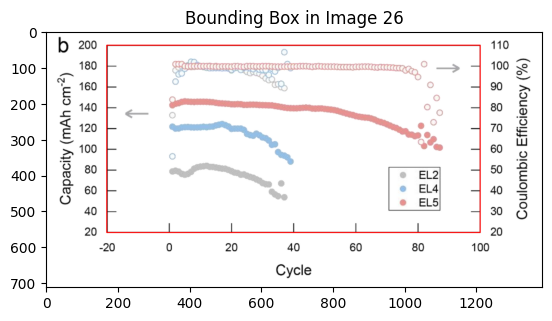

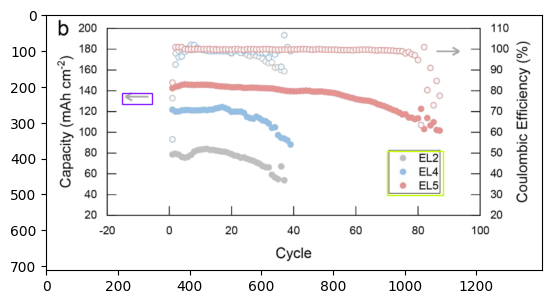

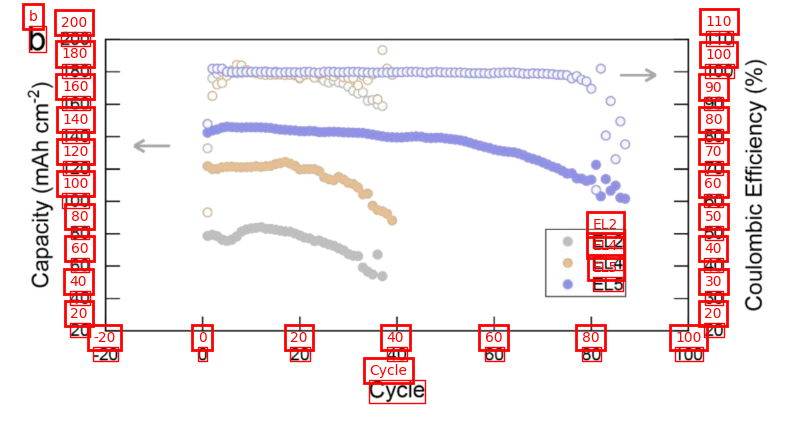

Y MIN 20
Y MAX 200
SEMANTIC Y MIN 20.0
SEMANTIC Y MAX 200.0
Y
OCR DIFF -519.6121896505356
SEM DIFF 180.0
OCR RATIO -2.88673438694742
PIXEL DIFF -2.3739048838615417
REAL DIFF FROM BASE POINT 0.8223496053517517
Y_MIN 19.17765039464825
Y_MAX 199.6584048262785
SEMANTIC X MIN -20.0
SEMANTIC X MAX 100.0
X
OCR DIFF 1041.8924627751112
SEM DIFF 120.0
OCR RATIO 0.11517503416847501
PIXEL DIFF 1.201727256178856
REAL DIFF FROM BASE POINT 0.13840897779158745
X_MIN -20.13840897779159
X_MAX 99.87397662575937
X
Predicted [-20.13840897779159, 99.87397662575937]
Chat GPT [-20, 100]
Y
Predicted [19.17765039464825, 199.6584048262785]
Chat GPT [20, 200]


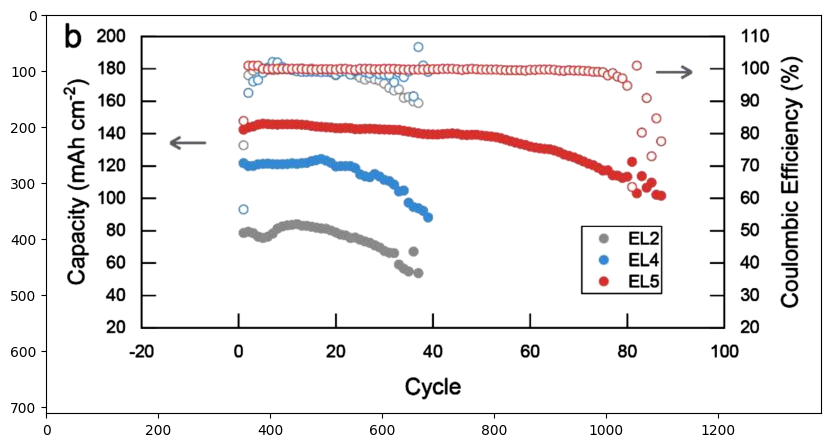

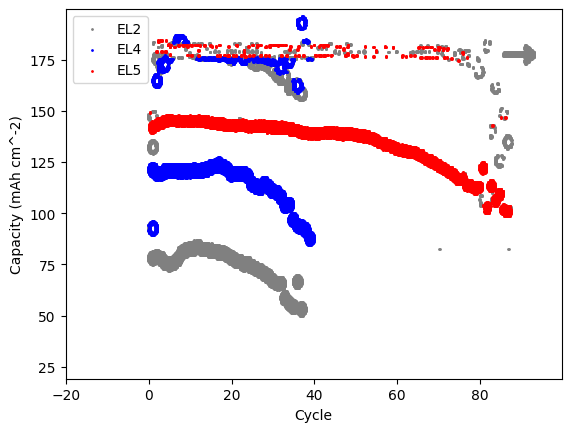

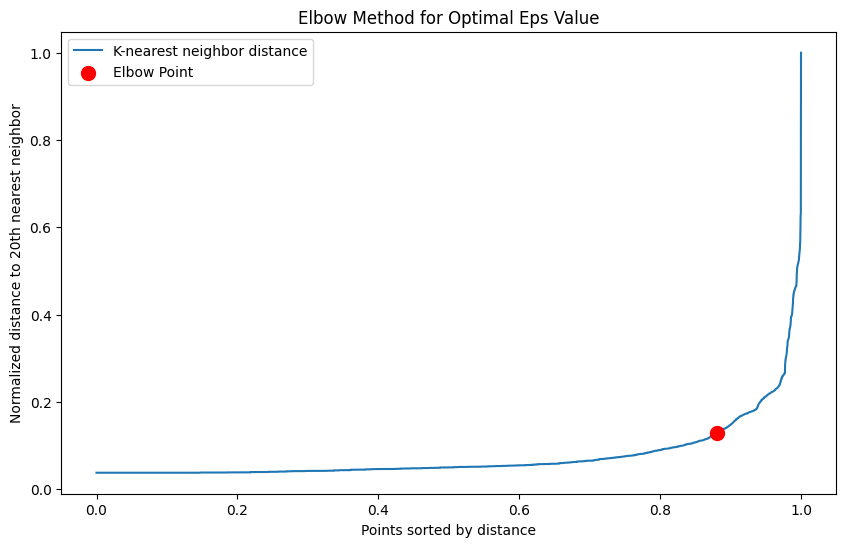

Number of clusters: 6
Number of outliers: 1111
Silhouette_score: 0.47654362300518316


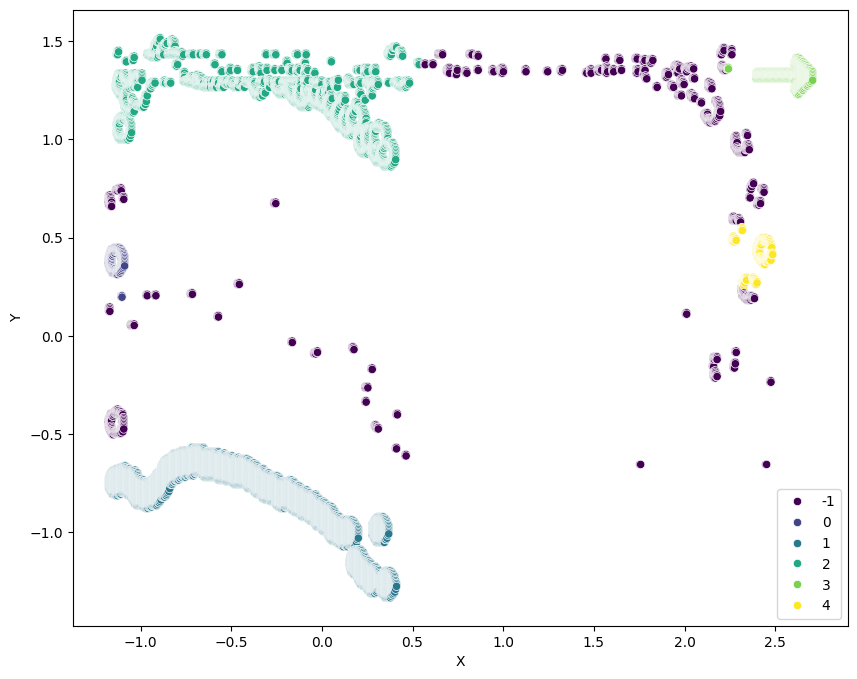

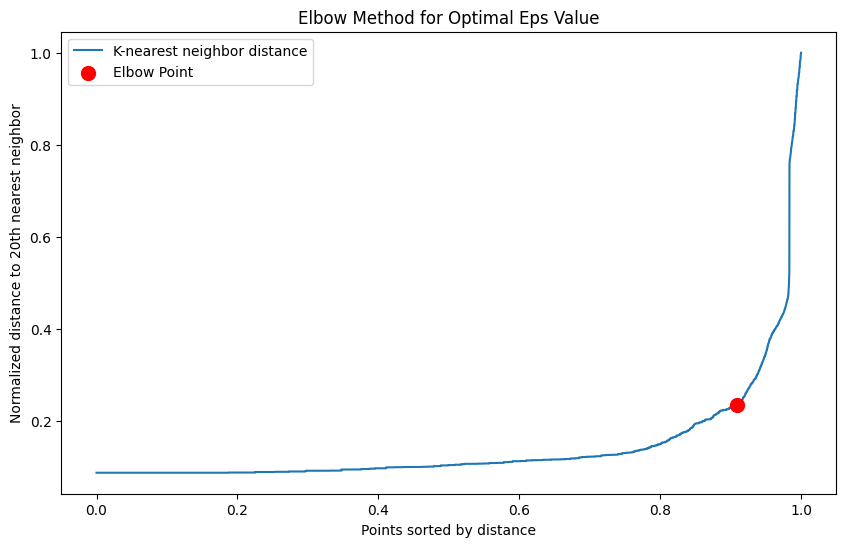

Number of clusters: 5
Number of outliers: 581
Silhouette_score: 0.4149074173872419


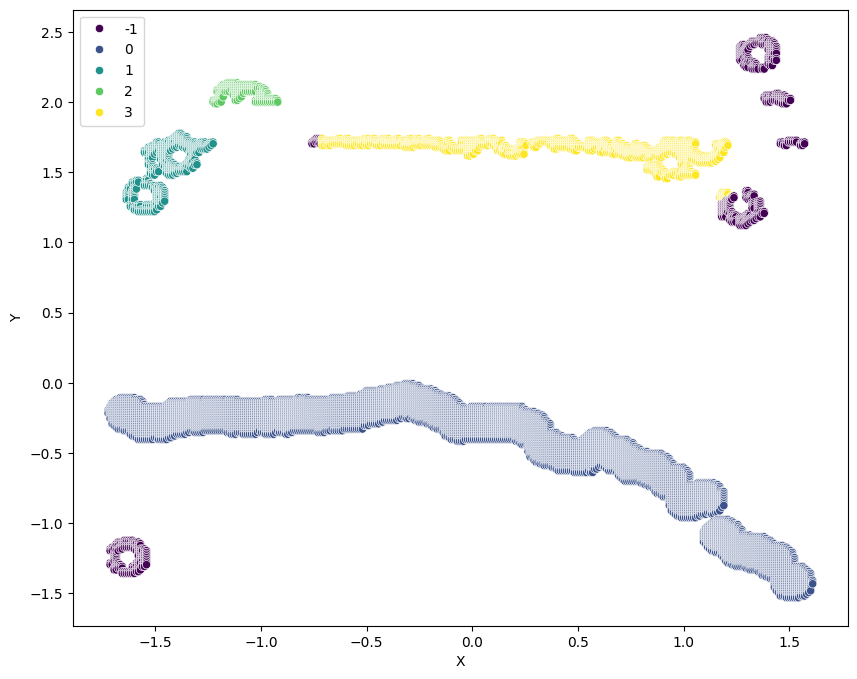

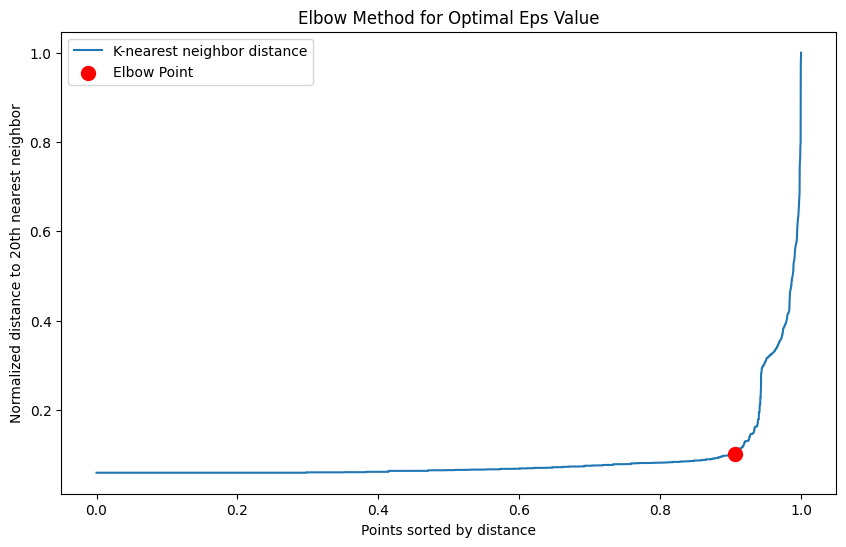

Number of clusters: 2
Number of outliers: 972
Silhouette_score: 0.4651561636052982
[-1 -1  0 ...  3  3  3]
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
(0.30117647058823527, 0.30117647058823527, 0.30117647058823527)
(0.20078431372549016, 0.20078431372549016, 0.20078431372549016)
(0.10039215686274508, 0.10039215686274508, 0.10039215686274508)
(0.0, 0.0, 0.0)
[0 0 0 ... 0 0 0]
(0.0, 0.0, 1.0)
(0.0, 0.0, 0.8)
(0.0, 0.0, 0.6)
(0.0, 0.0, 0.3999999999999999)
(0.0, 0.0, 0.19999999999999996)
[0 0 0 ... 0 0 0]
(1.0, 0.0, 0.0)
(0.8, 0.0, 0.0)


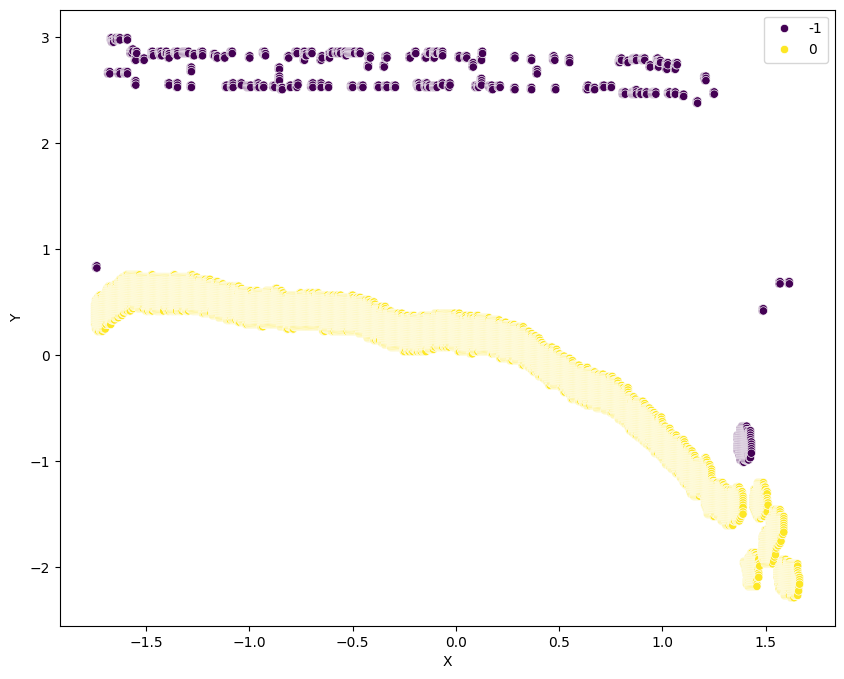

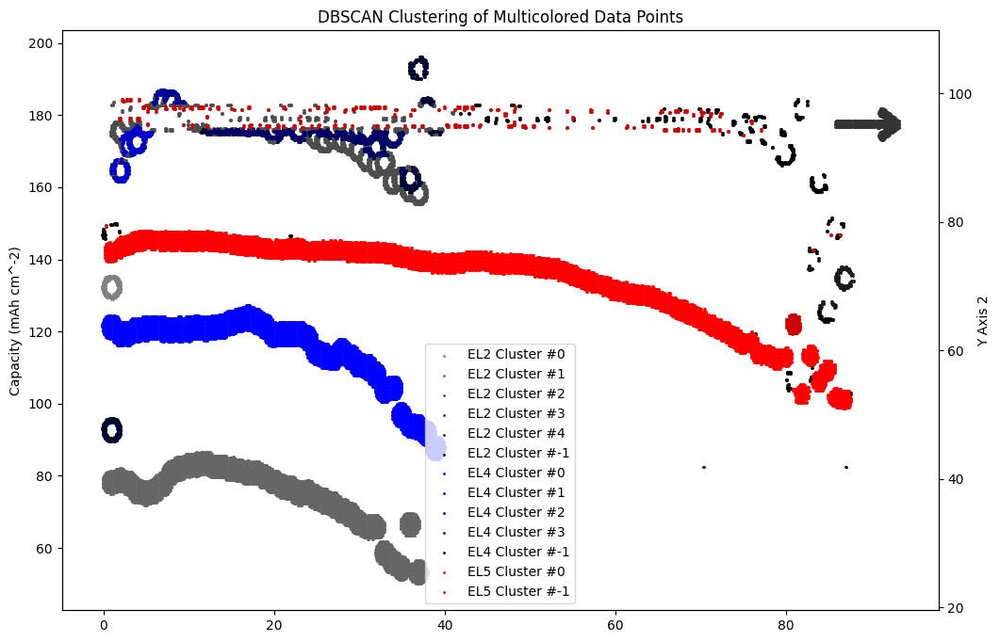

[-1 -1  0 ...  3  3  3]
Color (0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
Label EL2 Cluster #0
Marker o
Color (0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
Label EL2 Cluster #1
Marker o
Color (0.30117647058823527, 0.30117647058823527, 0.30117647058823527)
Label EL2 Cluster #2
Marker o
Color (0.20078431372549016, 0.20078431372549016, 0.20078431372549016)
Label EL2 Cluster #3
Marker o
Color (0.10039215686274508, 0.10039215686274508, 0.10039215686274508)
Label EL2 Cluster #4
Marker o
Color (0.0, 0.0, 0.0)
Label EL2 Cluster #-1
Marker *
[0 0 0 ... 0 0 0]
Color (0.0, 0.0, 1.0)
Label EL4 Cluster #0
Marker o
Color (0.0, 0.0, 0.8)
Label EL4 Cluster #1
Marker *
Color (0.0, 0.0, 0.6)
Label EL4 Cluster #2
Marker *
Color (0.0, 0.0, 0.3999999999999999)
Label EL4 Cluster #3
Marker *
Color (0.0, 0.0, 0.19999999999999996)
Label EL4 Cluster #-1
Marker *
[0 0 0 ... 0 0 0]
Color (1.0, 0.0, 0.0)
Label EL5 Cluster #0
Marker o
Color (0.8, 0.0, 0.0)
Label EL5 Cluster #-1
Ma

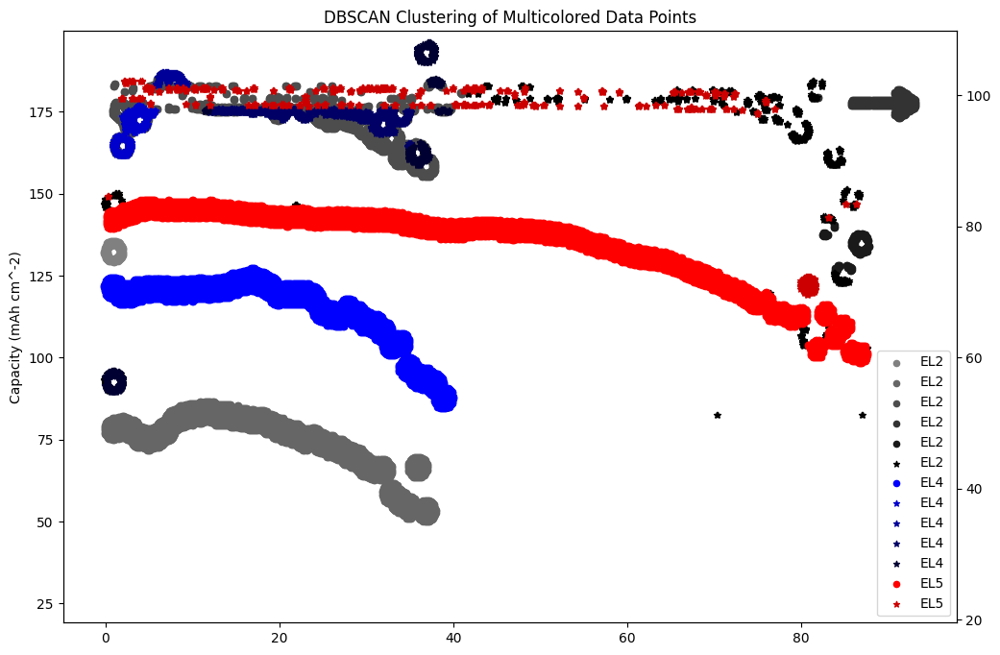

SECOND RANGE
SECOND Y MIN -80
SECOND Y MAX 120
SEMANTIC SECOND Y MIN -80.0
SEMANTIC SECOND Y MAX 120.0
SECOND Y
OCR DIFF -519.334843877703
SEM DIFF 200.0
OCR RATIO -2.5966742193885146
PIXEL DIFF -2.552435625344515
REAL DIFF FROM BASE POINT 0.9829633637852278
SECOND Y_MIN -80.98296336378523
SECOND Y_MAX 120.0434095644771
{'topLeft': (171, 39), 'bottomRight': (1215, 561)}


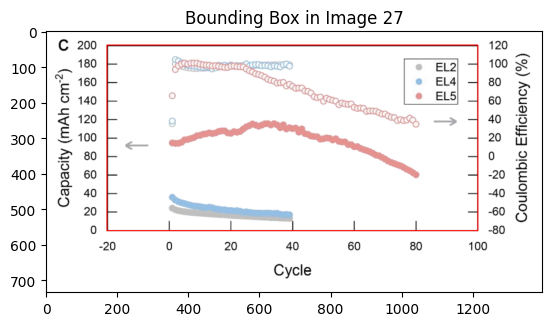

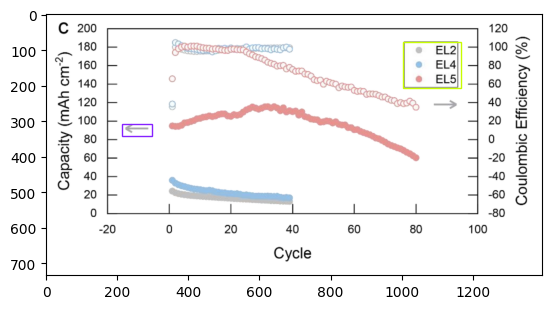

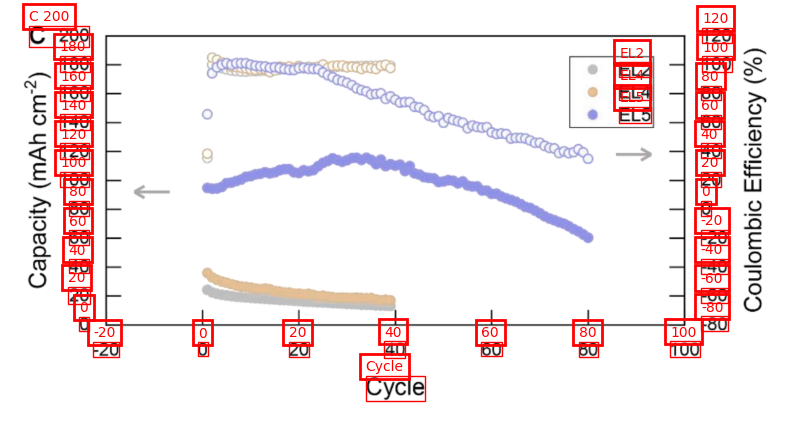

Y MIN 0
Y MAX 180
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 180.0
Y
OCR DIFF -467.96967074275017
SEM DIFF 180.0
OCR RATIO -2.59983150412639
PIXEL DIFF -2.440985720604658
REAL DIFF FROM BASE POINT 0.9389015083209755
Y_MIN -0.9389015083209755
Y_MAX 199.84334117605843
SEMANTIC X MIN -20.0
SEMANTIC X MAX 100.0
X
OCR DIFF 1042.8252710029483
SEM DIFF 120.0
OCR RATIO 0.11507200998743417
PIXEL DIFF 1.8106782734394073
REAL DIFF FROM BASE POINT 0.20835838836524953
X_MIN -20.208358388365248
X_MAX 99.92682003851601
X
Predicted [-20.208358388365248, 99.92682003851601]
Chat GPT [-20, 100]
Y
Predicted [-0.9389015083209755, 199.84334117605843]
Chat GPT [0, 200]


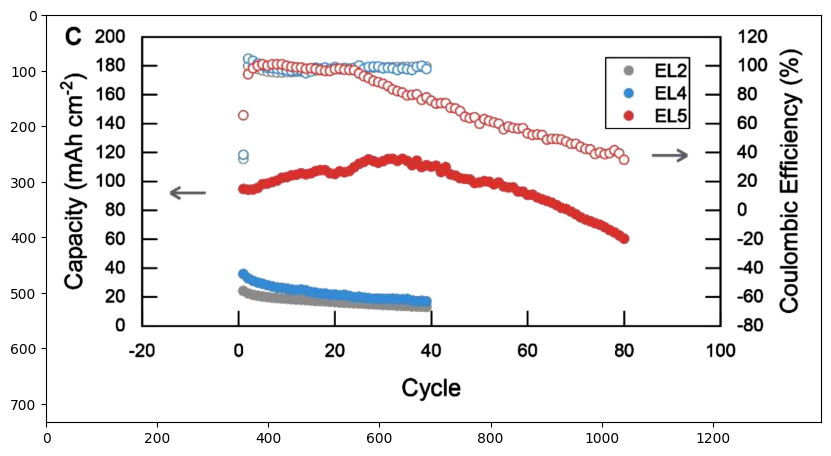

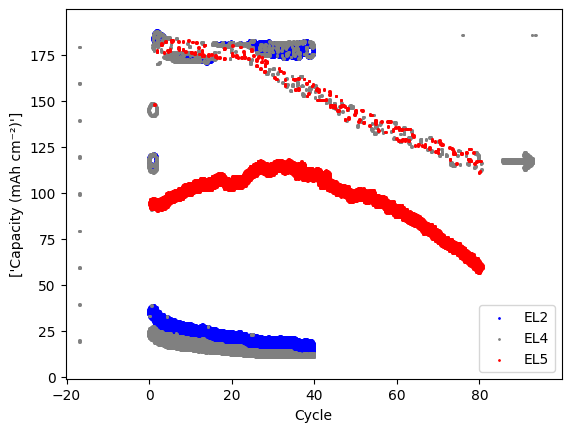

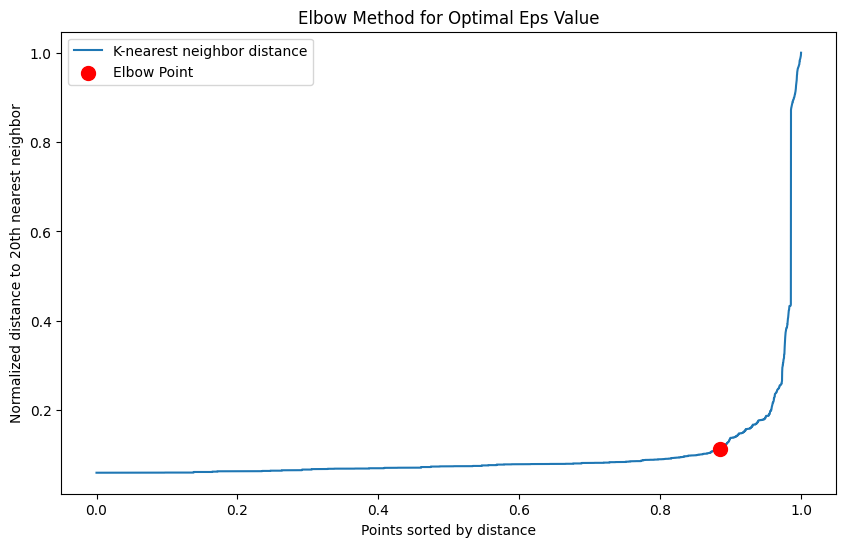

Number of clusters: 4
Number of outliers: 829
Silhouette_score: 0.5269317322011249


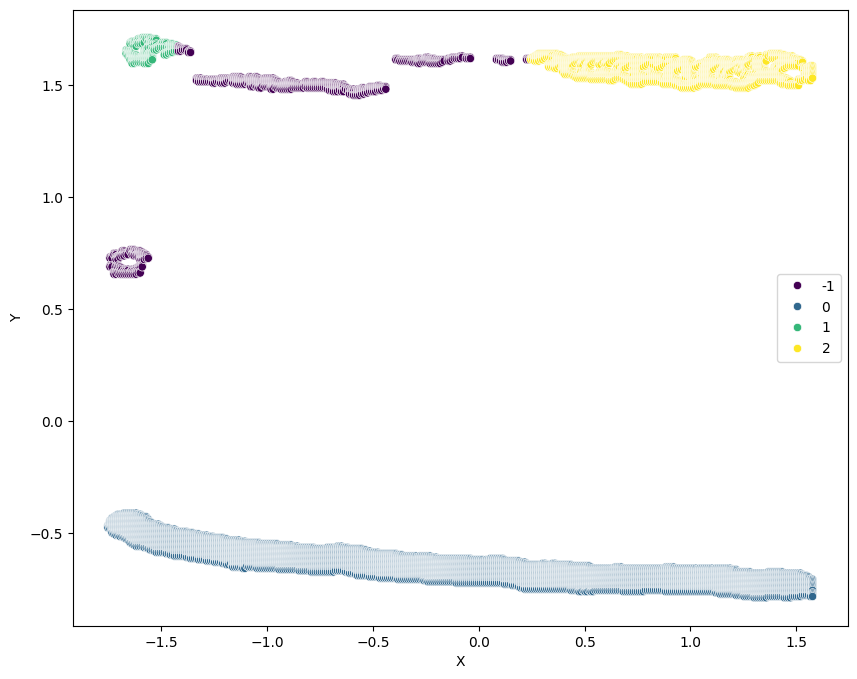

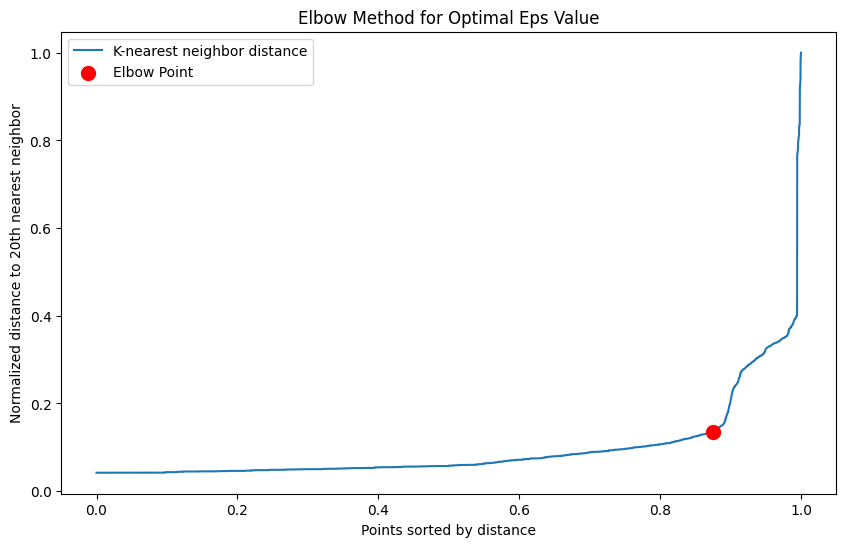

Number of clusters: 5
Number of outliers: 987
Silhouette_score: 0.5385826580348638


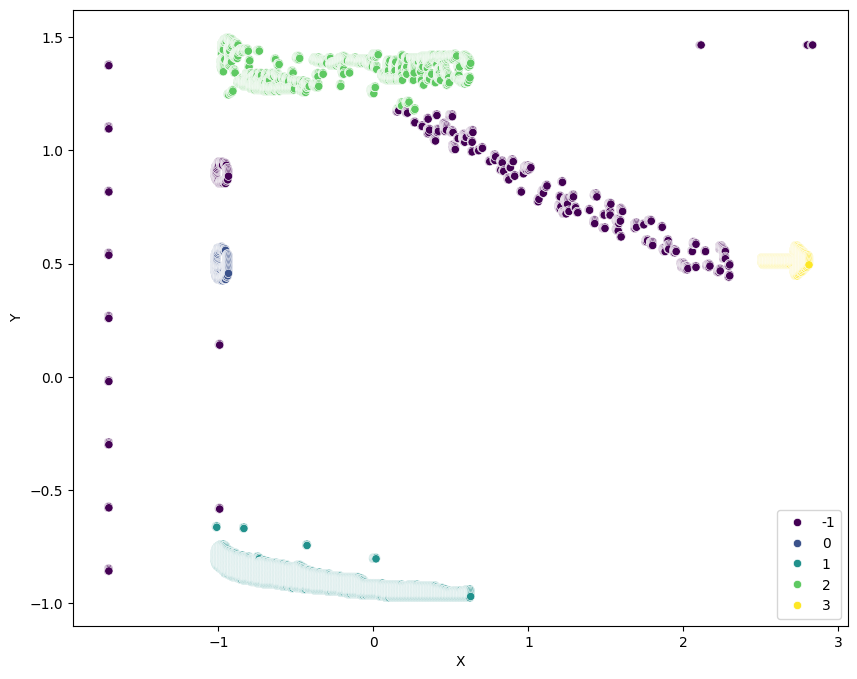

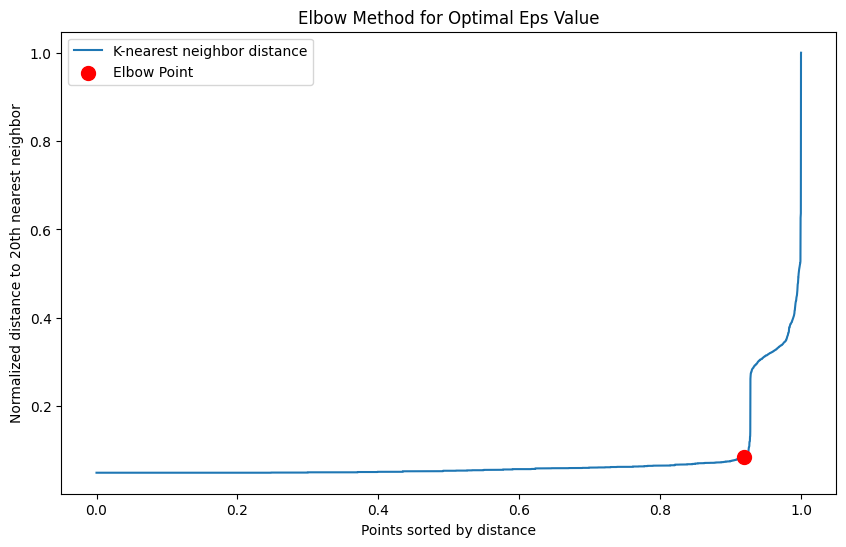

Number of clusters: 2
Number of outliers: 1002
Silhouette_score: 0.5084308331393219
[0 0 0 ... 0 0 0]
(0.0, 0.0, 1.0)
(0.0, 0.0, 0.8)
(0.0, 0.0, 0.6)
(0.0, 0.0, 0.3999999999999999)
[-1 -1 -1 ... -1 -1 -1]
(0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
(0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
(0.30117647058823527, 0.30117647058823527, 0.30117647058823527)
(0.20078431372549016, 0.20078431372549016, 0.20078431372549016)
(0.10039215686274508, 0.10039215686274508, 0.10039215686274508)
[0 0 0 ... 0 0 0]
(1.0, 0.0, 0.0)
(0.8, 0.0, 0.0)


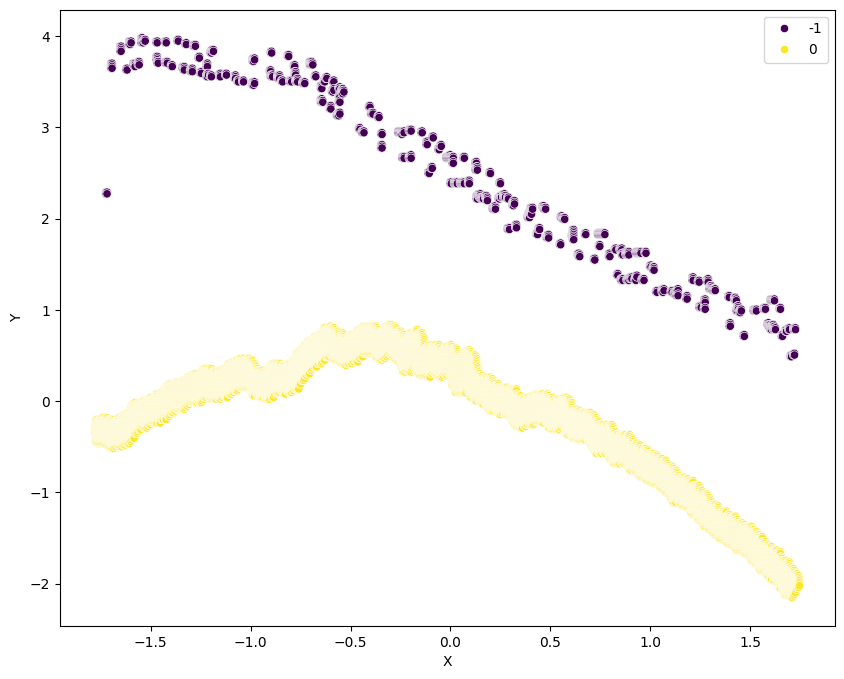

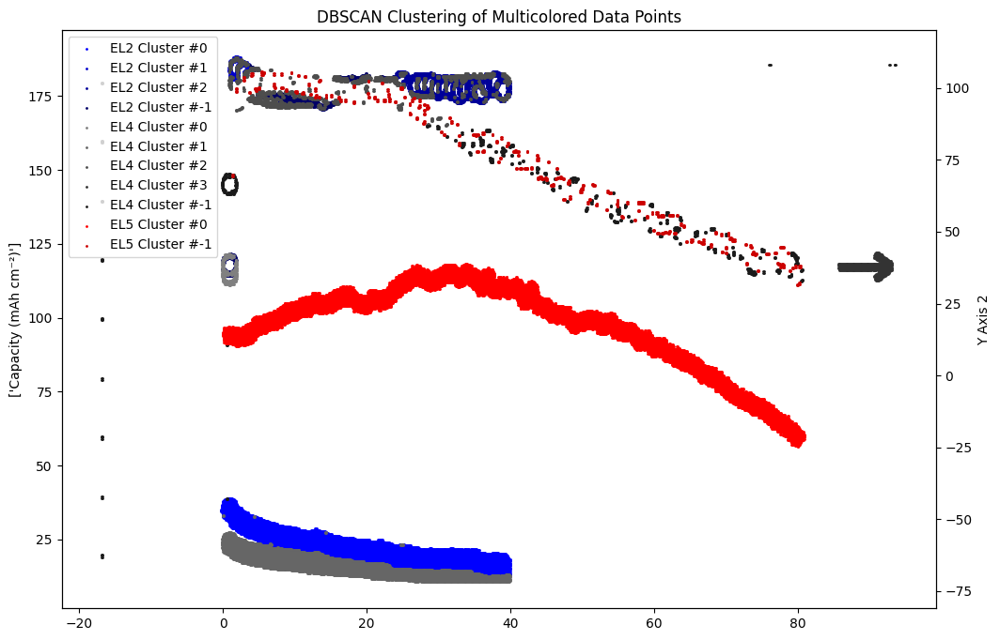

[0 0 0 ... 0 0 0]
Color (0.0, 0.0, 1.0)
Label EL2 Cluster #0
Marker o
Color (0.0, 0.0, 0.8)
Label EL2 Cluster #1
Marker *
Color (0.0, 0.0, 0.6)
Label EL2 Cluster #2
Marker *
Color (0.0, 0.0, 0.3999999999999999)
Label EL2 Cluster #-1
Marker *
[-1 -1 -1 ... -1 -1 -1]
Color (0.5019607843137255, 0.5019607843137255, 0.5019607843137255)
Label EL4 Cluster #0
Marker *
Color (0.40156862745098043, 0.40156862745098043, 0.40156862745098043)
Label EL4 Cluster #1
Marker *
Color (0.30117647058823527, 0.30117647058823527, 0.30117647058823527)
Label EL4 Cluster #2
Marker *
Color (0.20078431372549016, 0.20078431372549016, 0.20078431372549016)
Label EL4 Cluster #3
Marker *
Color (0.10039215686274508, 0.10039215686274508, 0.10039215686274508)
Label EL4 Cluster #-1
Marker *
[0 0 0 ... 0 0 0]
Color (1.0, 0.0, 0.0)
Label EL5 Cluster #0
Marker o
Color (0.8, 0.0, 0.0)
Label EL5 Cluster #-1
Marker *


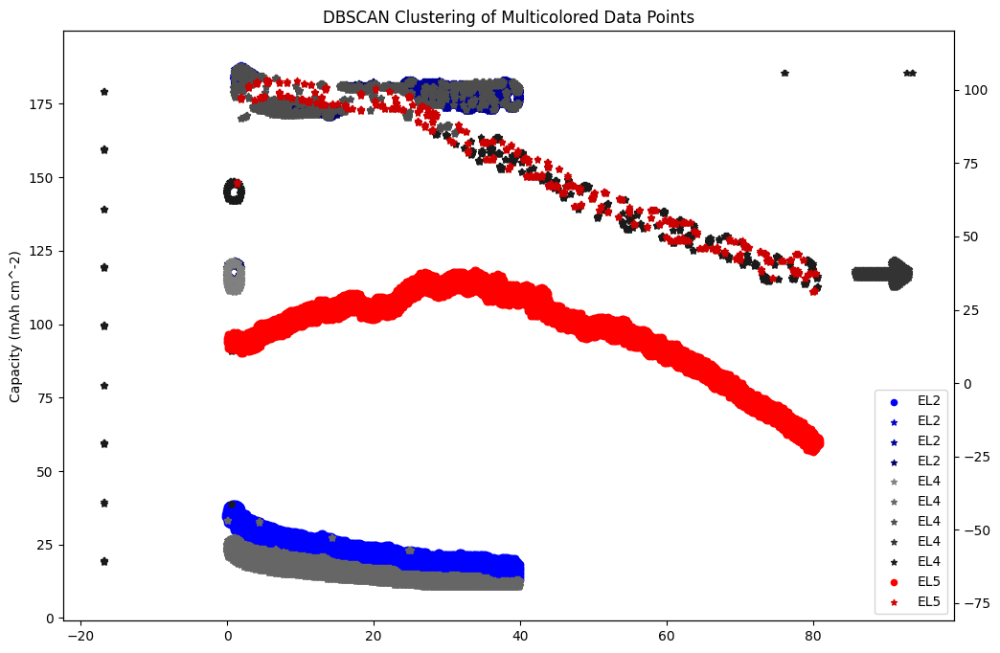

SECOND RANGE
SECOND Y MIN 0
SECOND Y MAX 100
SEMANTIC SECOND Y MIN 0.0
SEMANTIC SECOND Y MAX 100.0
SECOND Y
OCR DIFF -447.1379888653755
SEM DIFF 100.0
OCR RATIO -4.471379888653755
PIXEL DIFF 1.065982148051262
REAL DIFF FROM BASE POINT -0.23840115905969428
SECOND Y_MIN 0.23840115905969428
SECOND Y_MAX 110.49519263656322
{'topLeft': (133, 30), 'bottomRight': (1388, 523)}


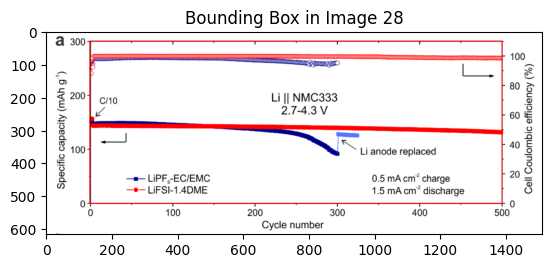

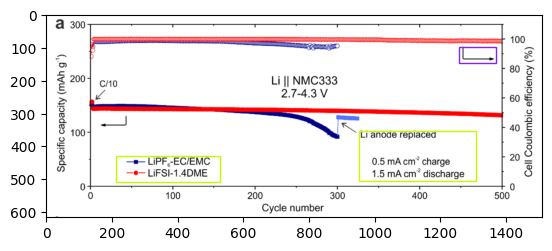

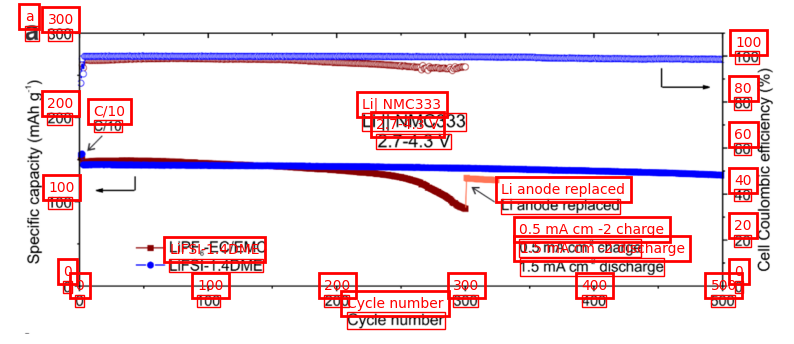

Y MIN 0
Y MAX 300
SEMANTIC Y MIN 0.0
SEMANTIC Y MAX 300.0
Y
OCR DIFF -491.64411003887653
SEM DIFF 300.0
OCR RATIO -1.6388137001295884
PIXEL DIFF 0.9052019119262695
REAL DIFF FROM BASE POINT -0.552351931067388
Y_MIN 0.552351931067388
Y_MAX 301.3797125767688
SEMANTIC X MIN 0.0
SEMANTIC X MAX 500.0
X
OCR DIFF 1253.0580368544906
SEM DIFF 500.0
OCR RATIO 0.39902381637097445
PIXEL DIFF 2.0019089225679636
REAL DIFF FROM BASE POINT 0.7988093383101744
X_MIN -0.7988093383101744
X_MAX 499.9760802072628
X
Predicted [-0.7988093383101744, 499.9760802072628]
Chat GPT [0, 500]
Y
Predicted [0.552351931067388, 301.3797125767688]
Chat GPT [0, 300]


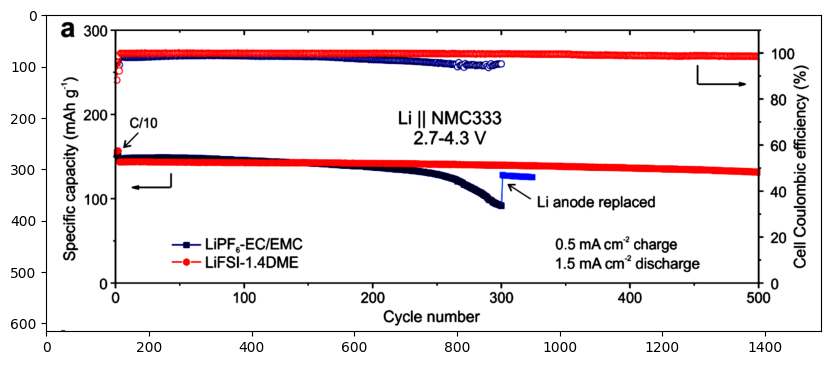

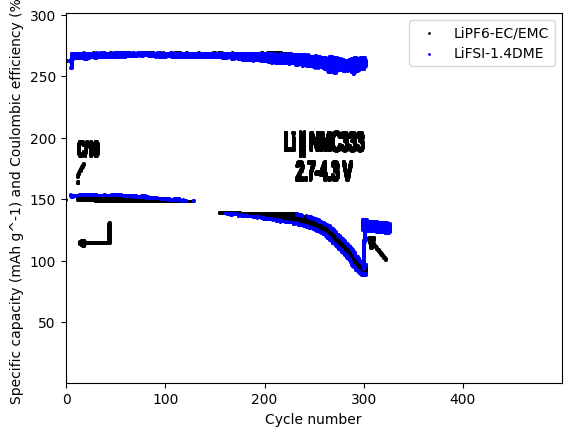

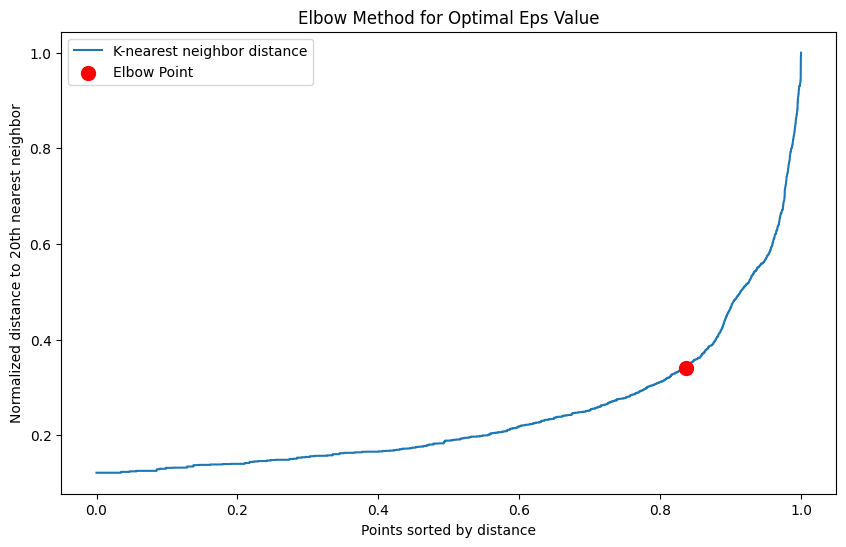

Number of clusters: 8
Number of outliers: 1025
Silhouette_score: 0.40321212581721727


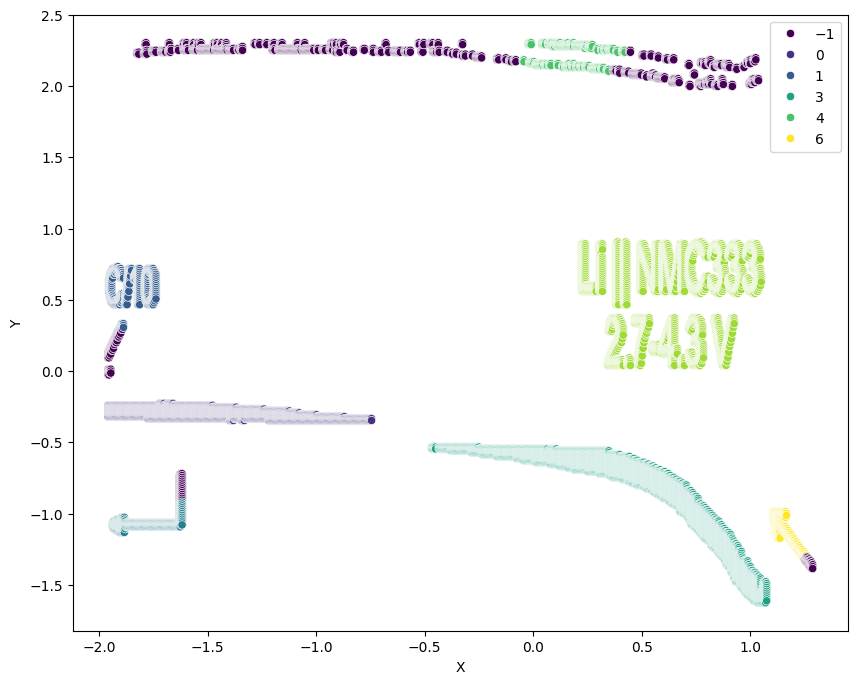

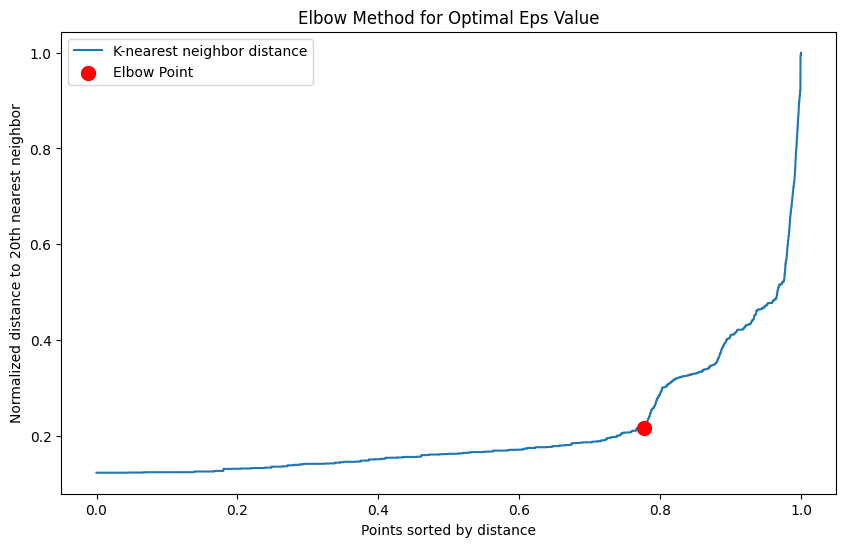

Number of clusters: 3
Number of outliers: 2221
Silhouette_score: 0.45828750688834496
[-1 -1 -1 ... -1 -1 -1]
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
(0.0, 0.0, 0.0)
(-0.0, -0.0, -0.0)
(-0.0, -0.0, -0.0)
[-1 -1  0 ...  1  1  1]
(0.0, 0.0, 1.0)
(0.0, 0.0, 0.8)
(0.0, 0.0, 0.6)


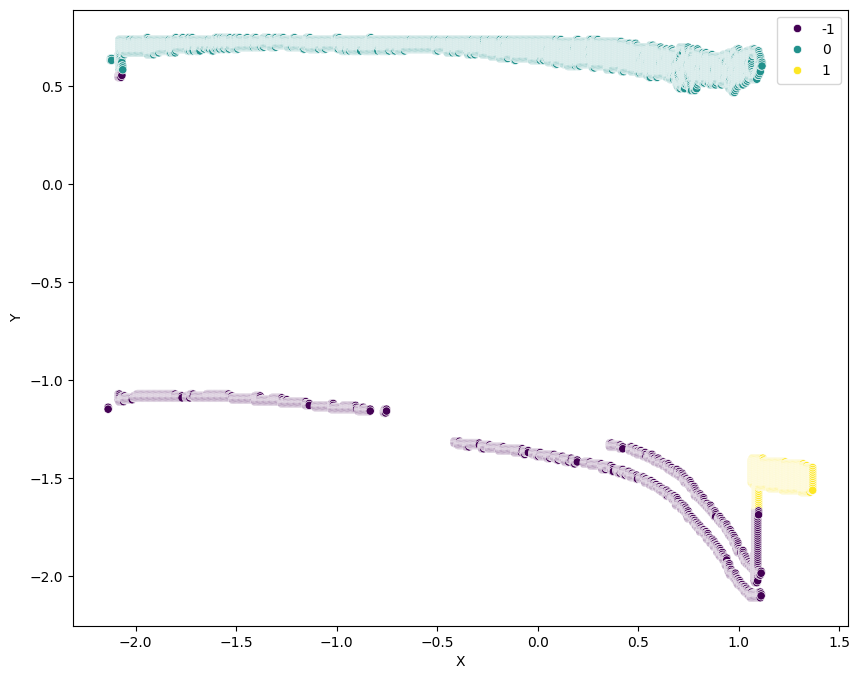

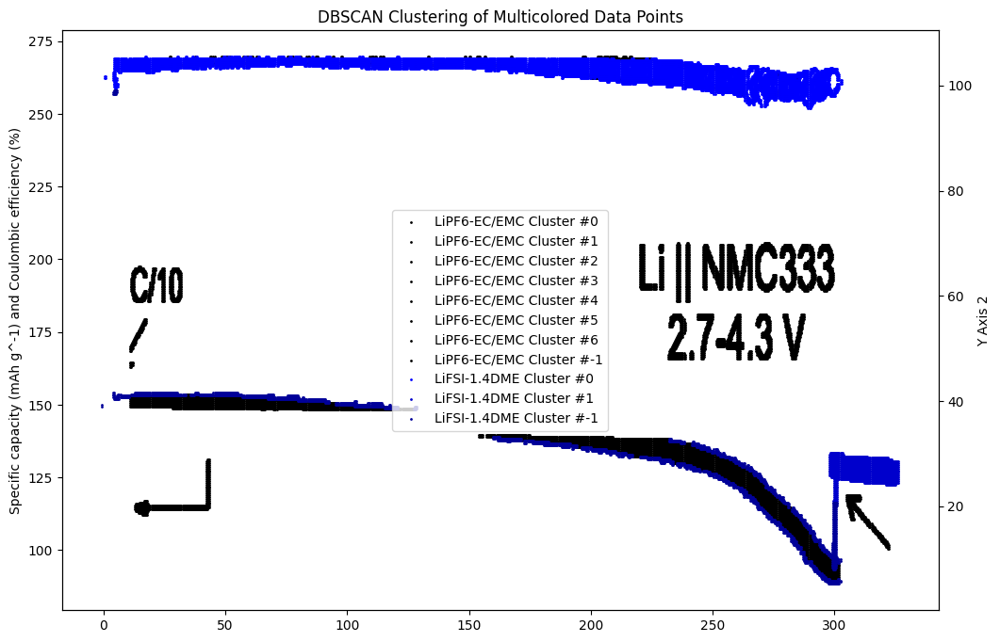

[-1 -1 -1 ... -1 -1 -1]
Color (0.0, 0.0, 0.0)
Label LiPF6-EC/EMC Cluster #0
Marker o
Color (0.0, 0.0, 0.0)
Label LiPF6-EC/EMC Cluster #1
Marker o
Color (0.0, 0.0, 0.0)
Label LiPF6-EC/EMC Cluster #2
Marker o
Color (0.0, 0.0, 0.0)
Label LiPF6-EC/EMC Cluster #3
Marker *
Color (0.0, 0.0, 0.0)
Label LiPF6-EC/EMC Cluster #4
Marker *
Color (0.0, 0.0, 0.0)
Label LiPF6-EC/EMC Cluster #5
Marker *
Color (-0.0, -0.0, -0.0)
Label LiPF6-EC/EMC Cluster #6
Marker *
Color (-0.0, -0.0, -0.0)
Label LiPF6-EC/EMC Cluster #-1
Marker v
[-1 -1  0 ...  1  1  1]
Color (0.0, 0.0, 1.0)
Label LiFSI-1.4DME Cluster #0
Marker o
Color (0.0, 0.0, 0.8)
Label LiFSI-1.4DME Cluster #1
Marker o
Color (0.0, 0.0, 0.6)
Label LiFSI-1.4DME Cluster #-1
Marker v



A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


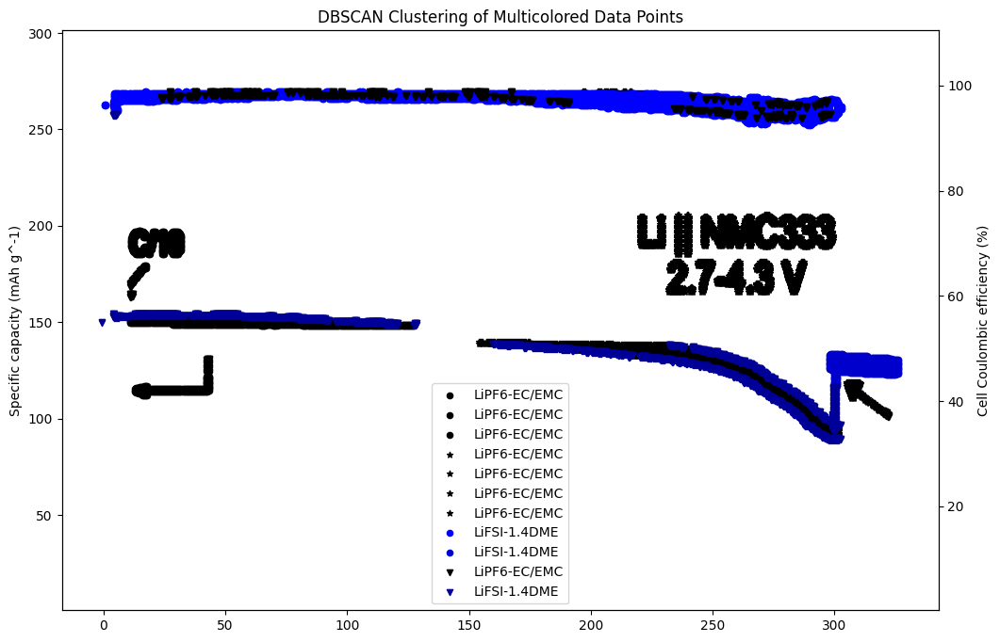

In [17]:
min_samples_200 = 200
for image_num in range(1, 29):
    if second_axis[image_num]:
        try:
            run_pipeline(image_num, min_samples_200)
        except: 
            print("ERROR PIPELINE #", image_num)